In [1]:
import pathlib
import warnings

import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from scipy.cluster.hierarchy import dendrogram, linkage

import umap

# warnings.filterwarnings("ignore")

pd.options.display.max_columns = 100
pd.options.display.max_rows = 100

In [2]:
random_state = 2025

In [3]:
df_ipipneo_120 = pd.read_csv("../data/kaggle/IPIP120-SCORES.csv")

In [6]:
# df_ipipneo_300 = pd.read_csv("../data/kaggle/IPIP300-SCORES.csv")

# IPIP-NEO-120

In [4]:
df_ipipneo_120

,case,sex,age,sec,min,hour,day,month,year,country,i1,i2,i3,i4,i5,i6,i7,i8,i9,i10,i11,i12,i13,i14,i15,i16,i17,i18,i19,i20,i21,i22,i23,i24,i25,i26,i27,i28,i29,i30,i31,i32,i33,i34,i35,i36,i37,i38,i39,i40,...,i106,i107,i108,i109,i110,i111,i112,i113,i114,i115,i116,i117,i118,i119,i120,openness,facet_imagination,facet_artistic_interests,facet_emotionality,facet_adventurousness,facet_intellect,facet_liberalism,conscientiousness,facet_self_efficacy,facet_orderliness,facet_dutifulness,facet_achievement_striving,facet_self_discipline,facet_cautiousness,extraversion,facet_friendliness,facet_gregariousness,facet_assertiveness,facet_activity_level,facet_excitement_seeking,facet_cheerfulness,agreeableness,facet_trust,facet_morality,facet_altruism,facet_cooperation,facet_modesty,facet_sympathy,neuroticism,facet_anxiety,facet_anger,facet_depression,facet_self_consciousness,facet_immoderation,facet_vulnerability
0,1,2,19,8,41,16,30,6,101,South Afr,5,4,5,4,4,2,5,5,4,4,2,4,4,4,4,1,2,4,5,4,5,4,4,3,2,2,4,2,4,4,2,4,4,4,4,2,4,4,4,1,...,4,2,3,4,4,5,2,4,4,4,2,4,1,5,4,64.796448,75.254232,40.432058,73.068513,71.832186,59.478950,36.369613,59.184103,59.751318,32.342786,54.892857,63.675297,41.888264,84.032423,56.493023,74.071748,65.945007,77.299926,12.265075,23.740125,66.964675,84.214345,73.438475,72.159605,67.393775,76.776519,74.954334,77.384533,35.573367,27.993157,11.549711,58.018551,39.725121,96.864432,11.048211
1,2,2,22,24,45,16,30,6,101,USA,5,4,4,2,5,5,5,4,5,4,4,4,5,5,4,3,5,5,1,4,1,5,3,4,4,3,2,5,4,3,4,4,5,2,4,5,4,4,5,5,...,4,4,4,2,5,1,4,3,3,4,4,2,3,4,3,79.613711,64.308584,61.025761,31.735332,88.251745,57.360264,92.935640,68.648552,89.733171,68.013111,44.963610,16.580116,84.633574,67.456166,80.144284,77.267973,94.271135,47.536294,96.065024,87.511279,5.776425,47.158018,13.978142,83.405900,89.448233,4.270395,69.646885,67.981348,66.998550,58.854938,89.843818,89.880570,57.486716,1.000000,80.327511
2,6,1,13,14,6,17,30,6,101,USA,2,4,2,2,4,4,5,4,3,2,2,4,2,2,4,2,3,5,1,4,1,5,5,2,4,1,3,3,2,4,2,4,5,2,5,5,4,2,3,2,...,1,4,5,1,5,1,2,4,3,5,2,4,4,3,5,64.261833,53.844029,45.316184,3.200967,90.676932,74.703513,90.450637,74.412693,93.299004,24.272619,14.383704,80.885654,99.646135,74.813500,80.931850,70.526550,86.659049,39.758576,92.707965,73.646661,65.158443,1.000000,7.526992,7.408120,2.417954,3.278791,24.018170,12.400848,22.577376,33.979027,86.802916,29.000871,7.509259,6.890607,15.131043
3,7,2,18,25,11,17,30,6,101,USA,3,4,3,2,5,4,4,4,3,3,2,5,4,4,5,1,5,5,2,4,4,4,5,3,3,1,3,2,3,2,2,4,2,3,5,4,5,4,5,4,...,2,4,3,4,5,2,3,4,4,5,2,4,2,4,3,55.968730,8.914197,60.988360,49.758720,81.244372,86.121119,25.431828,83.546408,84.580163,65.878251,78.953690,82.391009,83.566408,60.403585,84.255079,74.071748,81.190659,96.180870,97.498896,23.740125,56.848582,44.246158,27.248015,72.159605,54.492760,52.320264,38.542547,41.268613,12.466800,12.195029,57.719898,18.108659,8.870845,44.831762,5.285188
4,8,2,24,19,25,17,30,6,101,USA,4,4,4,5,4,2,3,4,4,4,3,3,5,5,4,3,3,4,5,4,3,3,4,5,3,3,5,4,4,3,2,4,3,4,4,1,4,4,5,3,...,2,1,2,4,2,3,2,4,4,3,1,5,3,4,4,55.117886,53.832540,61.025761,44.585253,41.349092,47.129696,69.477439,38.370685,49.695823,52.603005,44.963610,16.580116,43.843893,42.280102,50.534797,49.513820,59.439053,37.789326,41.578470,22.776857,88.517103,77.026790,83.907554,58.955730,66.457831,82.330021,50.199377,55.939489,26.353107,21.800273,7.899414,26.475441,38.817649,62.697315,53.029251
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
410371,690852,2,29,35,18,23,15,4,111,Bulgaria,4,5,3,4,4,4,5,5,3,4,4,4,5,5,4,2,5,3,2,5,1,4,4,4,4,4,5,5,5,1,4,5,3,4,5,4,5,5,5,4,...,2,5,3,5,5,4,4,3,3,4,2,5,2,5,3,49.267742,14.717430,61.025761,70.476957,41.349092,37.007942,

In [5]:
df_ipipneo_120_float_cols = df_ipipneo_120.select_dtypes(include=["float64"]).columns
df_ipipneo_120[df_ipipneo_120_float_cols] = df_ipipneo_120[df_ipipneo_120_float_cols].astype(int)
df_ipipneo_120.columns = df_ipipneo_120.columns.str.strip().str.lower()

print(f"Dataset original total: {len(df_ipipneo_120)}")
print(f"Is there any missing value? {df_ipipneo_120.isnull().values.any()}")
print(f"How many missing values: {df_ipipneo_120.isnull().values.sum()}")

print("Removing invalid data from dataset: IPIP120")
df_ipipneo_120 = df_ipipneo_120[(df_ipipneo_120.loc[:, "i1":"i120"] != 0).all(axis=1)]

df_ipipneo_120 = df_ipipneo_120.dropna(inplace=False)

print(f"New dataset total: {len(df_ipipneo_120)}")
print(f"Number of countries: {len(df_ipipneo_120.country.unique())}")

Dataset original total: 410376
Is there any missing value? True
How many missing values: 208
Removing invalid data from dataset: IPIP120
New dataset total: 410168
Number of countries: 240


## На результате основынх черт личности

In [6]:
X = df_ipipneo_120.copy()
model_five = X.filter(['openness', 'conscientiousness', 'extraversion', 'agreeableness', 'neuroticism'])
model_five.head()

,openness,conscientiousness,extraversion,agreeableness,neuroticism
0,64,59,56,84,35
1,79,68,80,47,66
2,64,74,80,1,22
3,55,83,84,44,12
4,55,38,50,77,26


### Kmeans

In [103]:
kmeans = KMeans(n_clusters=4, random_state=random_state)
kfit = kmeans.fit(model_five)

predictions = kfit.labels_
kmeans_model_five = model_five.copy()
kmeans_model_five["clusters"] = predictions
kmeans_model_five.head()

,openness,conscientiousness,extraversion,agreeableness,neuroticism,clusters
0,64,59,56,84,35,0
1,79,68,80,47,66,0
2,64,74,80,1,22,1
3,55,83,84,44,12,0
4,55,38,50,77,26,0


In [104]:
# Статистика по кластерам
print("\nСтатистика кластеров:")
cluster_stats = kmeans_model_five.groupby('clusters').agg({
    'openness': ['count', 'mean', 'std'],
    'conscientiousness': ['mean', 'std'],
    'extraversion': ['mean', 'std'],
    'agreeableness': ['mean', 'std'],
    'neuroticism': ['mean', 'std']
}).round(3)
cluster_stats


Статистика кластеров:


openness                 conscientiousness         extraversion  \
            count    mean     std              mean     std         mean   
clusters                                                                   
0           99253  67.308  17.780            68.601  22.553       69.931   
1           85483  42.308  26.040            31.863  19.859       66.331   
2          104514  37.409  27.068            36.379  24.964       19.891   
3          120918  17.937  13.859            75.910  17.025       56.328   

                 agreeableness         neuroticism          
             std          mean     std        mean     std  
clusters                                                    
0         21.341        70.808  19.165      24.718  19.578  
1         17.720        28.801  20.481      49.546  22.129  
2         15.518        44.676  26.456      75.601  18.047  
3         22.846        56.500  23.176      30.566  19.666

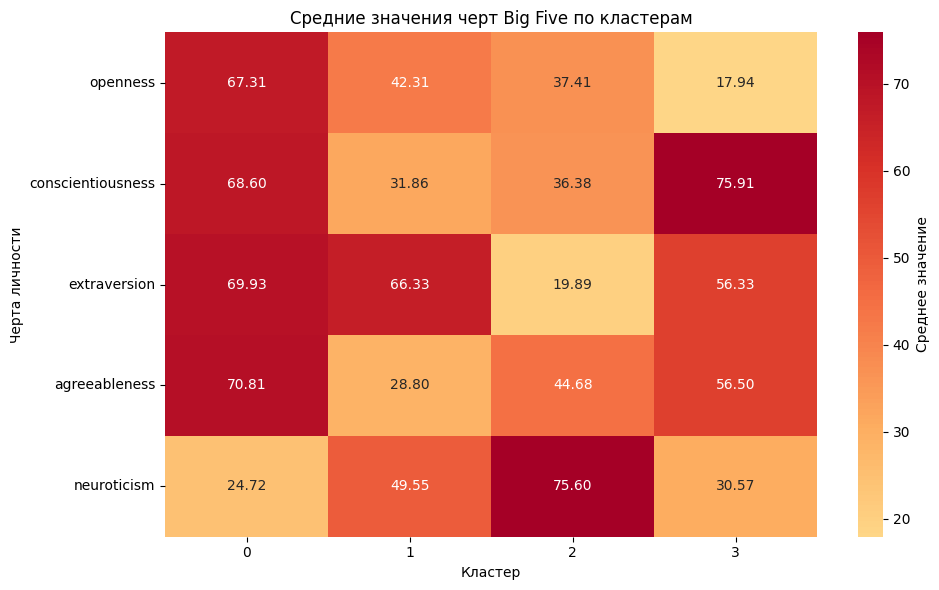

In [105]:
# Вычисляем средние значения
cluster_means = kmeans_model_five.groupby('clusters').mean()

# Визуализация heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(
    cluster_means.T, 
    annot=True, 
    fmt='.2f', 
    cmap='RdYlBu_r',
    center=0,
    cbar_kws={'label': 'Среднее значение'}
)
plt.title('Средние значения черт Big Five по кластерам')
plt.xlabel('Кластер')
plt.ylabel('Черта личности')
plt.tight_layout()
plt.show()

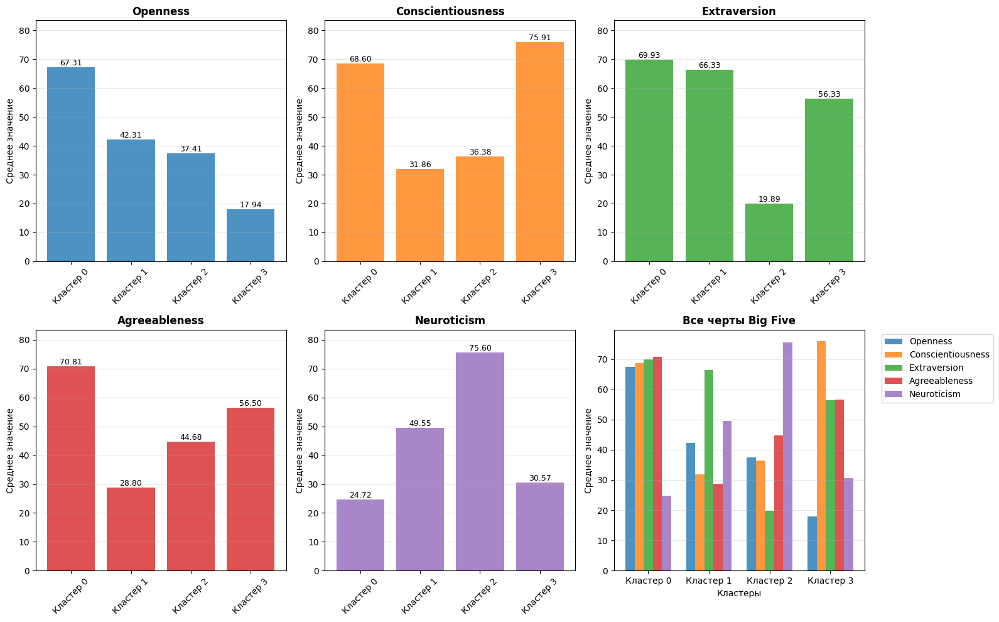

In [106]:
# Создаем сетку графиков
fig, axes = plt.subplots(2, 3, figsize=(16, 10))
axes = axes.flatten()

clusters = sorted(kmeans_model_five['clusters'].unique())
traits = ['openness', 'conscientiousness', 'extraversion', 
          'agreeableness', 'neuroticism', 'Все черты']
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']

for i, trait in enumerate(traits[:-1]):
    ax = axes[i]
    values = cluster_means[trait].values
    bars = ax.bar([f'Кластер {c}' for c in clusters], values, 
                  color=colors[i], alpha=0.8)
    
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.2f}', ha='center', va='bottom', fontsize=9)
    
    ax.set_title(f'{trait.capitalize()}', fontsize=12, fontweight='bold')
    ax.set_ylabel('Среднее значение')
    ax.set_ylim(0, cluster_means.values.max() * 1.1)
    ax.grid(True, alpha=0.3, axis='y')
    ax.tick_params(axis='x', rotation=45)

ax = axes[-1]
x = np.arange(len(clusters))
width = 0.15

for j, trait in enumerate(traits[:-1]):
    values = cluster_means[trait].values
    ax.bar(x + j*width, values, width, label=trait.capitalize(), 
           color=colors[j], alpha=0.8)

ax.set_xlabel('Кластеры')
ax.set_ylabel('Среднее значение')
ax.set_title('Все черты Big Five', fontsize=12, fontweight='bold')
ax.set_xticks(x + width * 2)
ax.set_xticklabels([f'Кластер {c}' for c in clusters])
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
ax.grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.show()

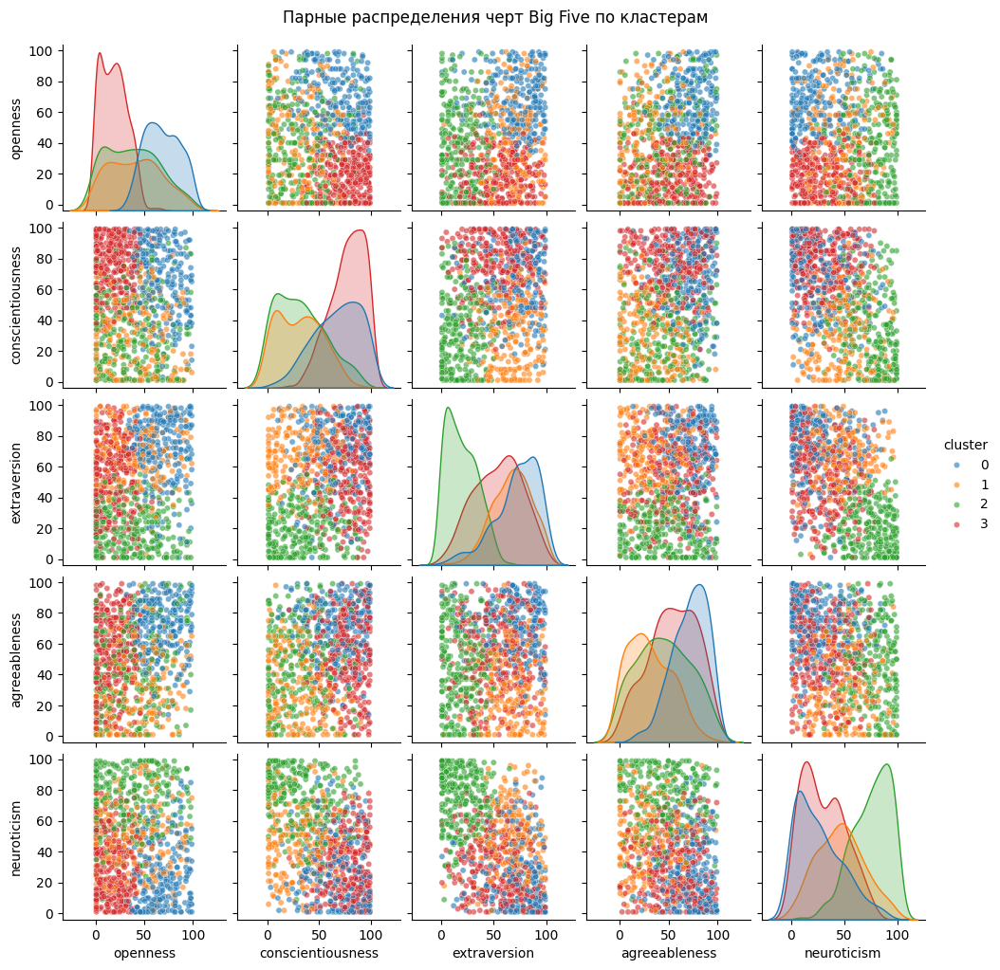

In [107]:
# Создаем DataFrame с кластерами для визуализации
viz_df = kmeans_model_five.copy()
viz_df['cluster'] = predictions

# Берем подвыборку для парных диаграмм (для скорости)
sample_viz = viz_df.sample(n=1000, random_state=42)

# Парные диаграммы рассеяния
g = sns.pairplot(
    sample_viz,
    vars=['openness', 'conscientiousness', 'extraversion', 
          'agreeableness', 'neuroticism'],
    hue='cluster',
    palette='tab10',
    plot_kws={'alpha': 0.6, 's': 20},
    diag_kind='kde',
    height=2
)
g.fig.suptitle('Парные распределения черт Big Five по кластерам', y=1.02)
plt.show()

#### PCA

PCA=2

In [108]:
pca = PCA(n_components=2)

df_pca = pd.DataFrame(data=pca.fit_transform(kmeans_model_five), columns=["X", "Y"])
df_pca["clusters"] = predictions

df_pca.head()

,X,Y,clusters
0,-23.965361,25.509778,0
1,-9.955434,34.533725,0
2,-21.283283,8.290864,1
3,-48.347696,4.463469,0
4,-12.095550,23.096299,0


Text(0.5, 1.0, 'Cluster Big-Five character | PCA')

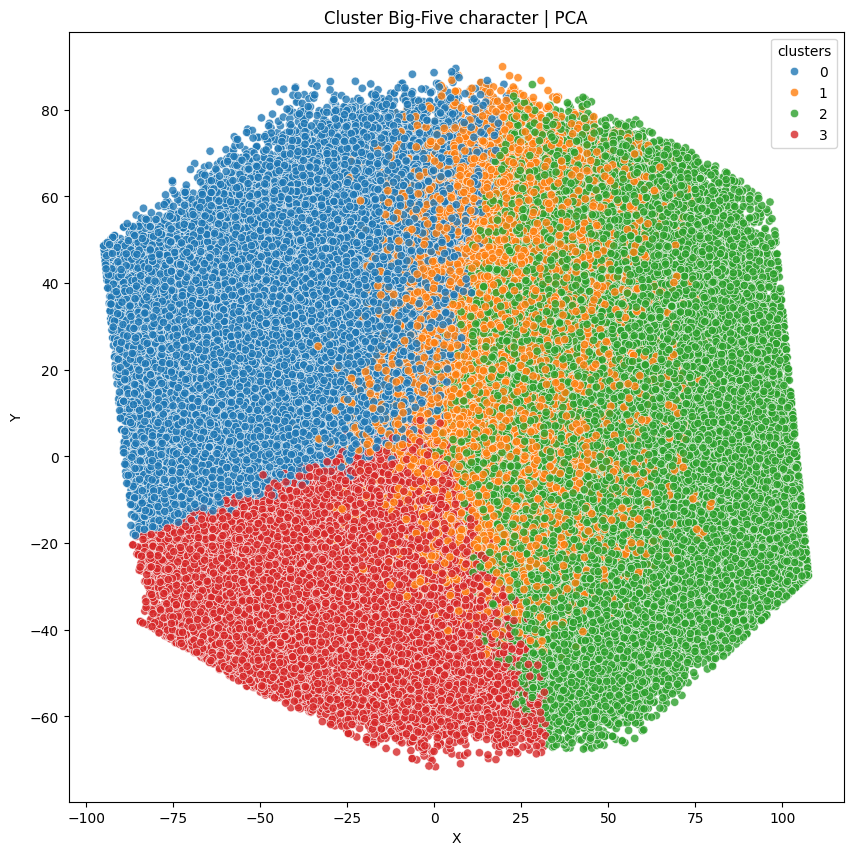

In [109]:
plt.figure(figsize=(10, 10))
sns.scatterplot(
    data=df_pca, x="X", y="Y", hue="clusters", legend="full", palette="tab10", alpha=0.8
)
plt.title("Cluster Big-Five character | PCA")

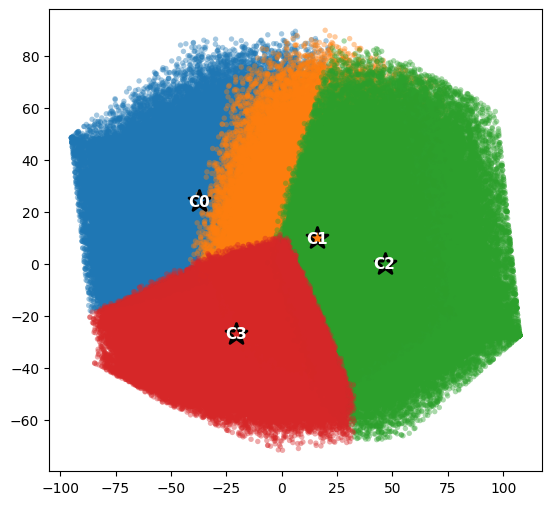

In [110]:
# Вычисляем центроиды кластеров
centroids_five = []
for cluster_id in sorted(df_pca['clusters'].unique()):
    cluster_data = df_pca[df_pca['clusters'] == cluster_id]
    centroid = cluster_data[['X', 'Y']].mean()
    centroids_five.append({
        'cluster': cluster_id,
        'X': centroid['X'],
        'Y': centroid['Y'],
        'size': len(cluster_data)
    })

centroids_df_five = pd.DataFrame(centroids_five)

# Визуализация с центроидами
plt.figure(figsize=(14, 6))

# Подграфик 1: PCA с центроидами
plt.subplot(1, 2, 1)

# Определяем цвета для кластеров
n_clusters = len(df_pca['clusters'].unique())
colors = plt.cm.tab10(np.linspace(0, 1, max(10, n_clusters)))

# Рисуем точки данных
for cluster_id in sorted(df_pca['clusters'].unique()):
    cluster_data = df_pca[df_pca['clusters'] == cluster_id]
    plt.scatter(
        cluster_data["X"], 
        cluster_data["Y"], 
        color=colors[cluster_id % len(colors)], 
        alpha=0.4, 
        s=15,
        label=f'Кластер {cluster_id}',
        edgecolors='none'
    )

# Рисуем центроиды
for _, centroid in centroids_df_five.iterrows():
    plt.scatter(
        centroid['X'], 
        centroid['Y'], 
        color=colors[int(centroid['cluster']) % len(colors)],
        s=250,
        marker='*',
        edgecolors='black',
        linewidth=2,
        zorder=5  # Поверх точек
    )
    
    # Подписываем центроиды
    plt.text(
        centroid['X'], 
        centroid['Y'], 
        f'C{int(centroid["cluster"])}', 
        fontsize=11, 
        fontweight='bold', 
        ha='center', 
        va='center',
        color='white',
        zorder=6
    )

PCA=3

In [ ]:
pca = PCA(n_components=3)

df_pca = pd.DataFrame(data=pca.fit_transform(kmeans_model_five), columns=["X", "Y", "Z"])
df_pca["clusters"] = predictions

df_pca.head()

,X,Y,Z,clusters
0,-23.978147,25.522457,22.353865,1
1,-9.966426,34.496700,-7.517837,1
2,-21.239974,8.131731,-48.755137,4
3,-48.360641,4.405863,-21.177592,0
4,-12.107415,23.097106,12.066383,1


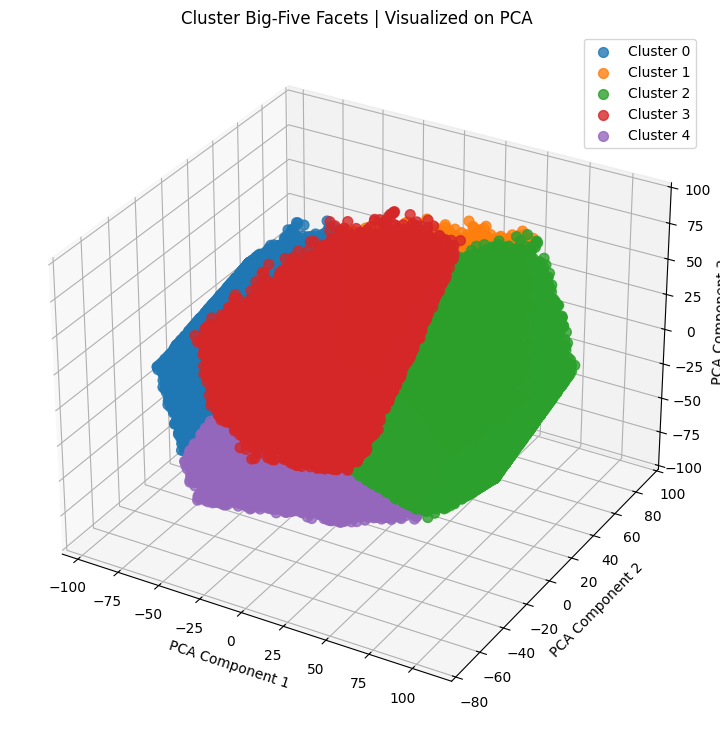

In [ ]:
fig = plt.figure(figsize=(12, 9))
ax = fig.add_subplot(111, projection='3d')

# Получаем уникальные кластеры и цвета
clusters = df_pca['clusters'].unique()
colors = plt.cm.tab10(range(len(clusters)))

# Рисуем каждый кластер отдельно
for cluster, color in zip(sorted(clusters), colors):
    mask = df_pca['clusters'] == cluster
    ax.scatter(
        df_pca.loc[mask, 'X'],
        df_pca.loc[mask, 'Y'],
        df_pca.loc[mask, 'Z'],
        label=f'Cluster {cluster}',
        alpha=0.8,
        s=50,
        color=color
    )

ax.set_xlabel('PCA Component 1')
ax.set_ylabel('PCA Component 2')
ax.set_zlabel('PCA Component 3')
ax.set_title('Cluster Big-Five character | PCA')
ax.legend()
plt.show()

#### t-SNE

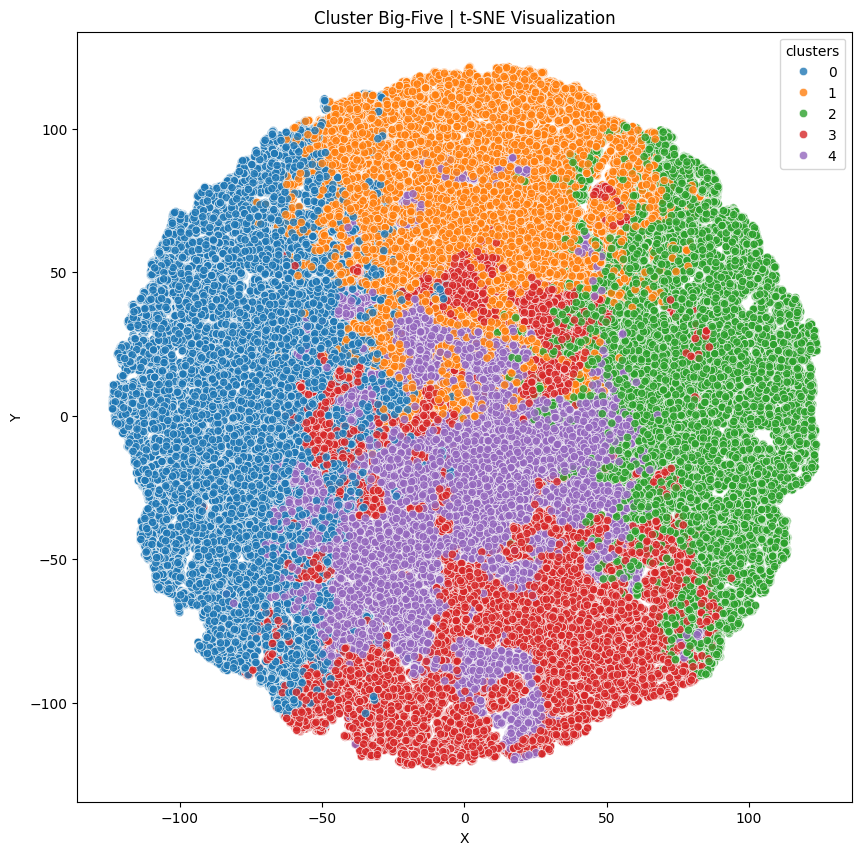

In [ ]:
tsne = TSNE(n_components=2, random_state=random_state)
df_tsne = pd.DataFrame(
    data=tsne.fit_transform(kmeans_model_five.drop('clusters', axis=1)),
    columns=["X", "Y"]
)
df_tsne["clusters"] = kmeans_model_five["clusters"].values

plt.figure(figsize=(10, 10))
sns.scatterplot(
    data=df_tsne, x="X", y="Y", hue="clusters", legend="full", palette="tab10", alpha=0.8
)
plt.title("Cluster Big-Five | t-SNE")
plt.show()

#### UMAP

d:\programming\GitHub\LLM-PersonaBench\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


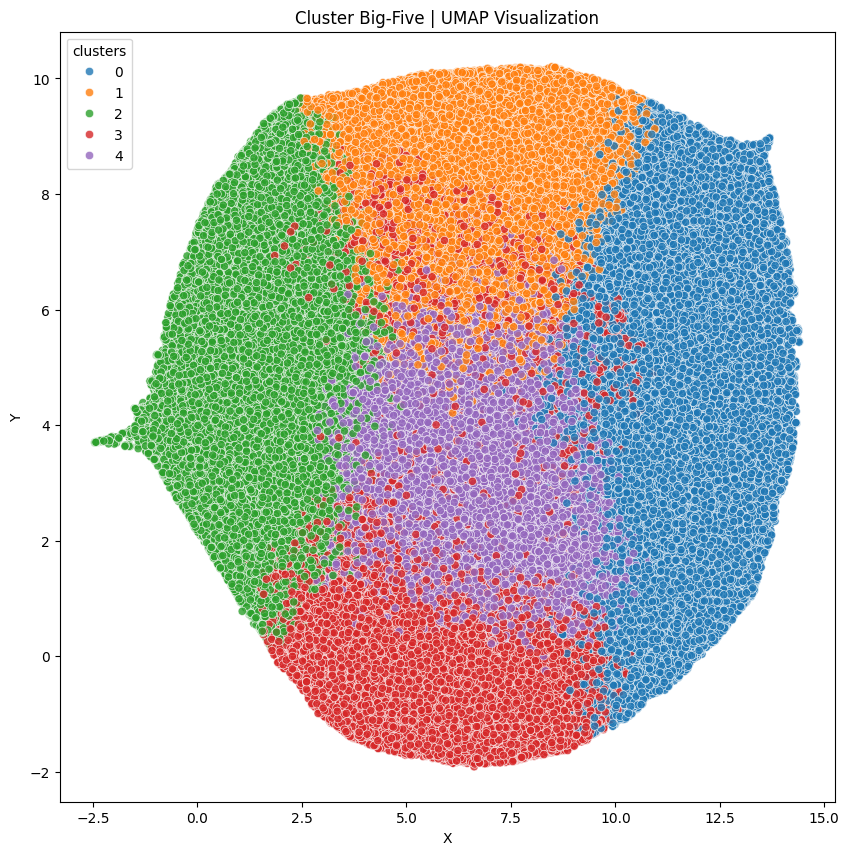

In [ ]:
mapper = umap.UMAP(n_components=2, random_state=random_state)
df_umap = pd.DataFrame(
    data=mapper.fit_transform(kmeans_model_five.drop('clusters', axis=1)),
    columns=["X", "Y"]
)
df_umap["clusters"] = kmeans_model_five["clusters"].values

plt.figure(figsize=(10, 10))
sns.scatterplot(
    data=df_umap, x="X", y="Y", hue="clusters", legend="full", palette="tab10", alpha=0.8
)
plt.title("Cluster Big-Five | UMAP")
plt.show()

### Иерархическая кластеризаци

In [30]:
hier_model_five = model_five.iloc[:10000]

In [31]:
hierarchical = AgglomerativeClustering(
    n_clusters=4, 
    linkage='ward',
    compute_distances=True  # для получения расстояний
)
hier_predictions = hierarchical.fit_predict(hier_model_five)


hier_model_five['hier_clusters'] = hier_predictions

In [32]:
# Статистика по кластерам
print("\nСтатистика кластеров:")
cluster_stats = hier_model_five.groupby('hier_clusters').agg({
    'openness': ['count', 'mean', 'std'],
    'conscientiousness': ['mean', 'std'],
    'extraversion': ['mean', 'std'],
    'agreeableness': ['mean', 'std'],
    'neuroticism': ['mean', 'std']
}).round(3)
cluster_stats


Статистика кластеров:


openness                 conscientiousness         extraversion  \
                 count    mean     std              mean     std         mean   
hier_clusters                                                                   
0                 2710  41.062  28.806            54.230  23.609       29.196   
1                 2723  69.578  17.803            56.783  28.752       71.046   
2                 2585  20.955  14.244            63.551  24.282       63.079   
3                 1982  40.835  25.802            19.449  16.339       34.676   

                      agreeableness         neuroticism          
                  std          mean     std        mean     std  
hier_clusters                                                    
0              20.465        53.031  26.640      62.627  20.553  
1              20.965        60.573  24.937      27.563  20.057  
2              20.722        48.843  26.334      30.694  20.438  
3              26.058        31.526  23.356      76.638  17.233

#### PCA

Объясненная дисперсия PCA: PC1=0.385, PC2=0.225
Суммарная объясненная дисперсия: 0.610
Найдено кластеров: 4

ЦЕНТРОИДЫ КЛАСТЕРОВ В PCA ПРОСТРАНСТВЕ
Кластер 0: PC1=16.842, PC2=-8.192
Кластер 1: PC1=-33.570, PC2=22.806
Кластер 2: PC1=-18.626, PC2=-23.185
Кластер 3: PC1=47.384, PC2=10.108


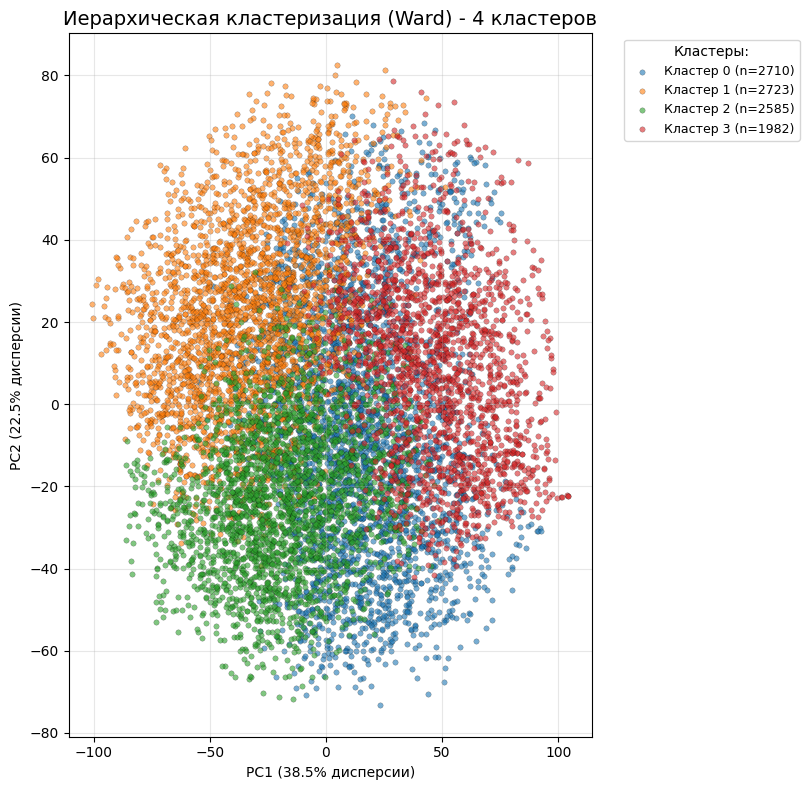

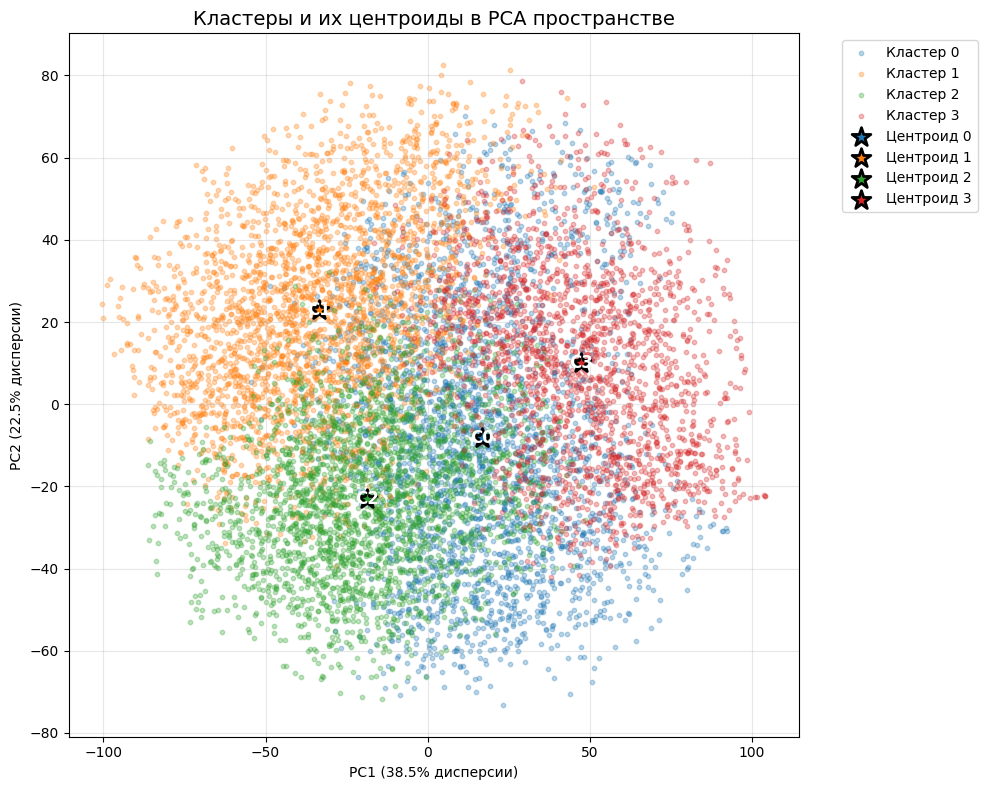

In [33]:
# Применяем PCA для уменьшения размерности до 2D
pca_hier = PCA(n_components=2)
X_pca = pca_hier.fit_transform(hier_model_five)

# Создаем DataFrame для визуализации
df_hier_pca = pd.DataFrame(
    data=X_pca,
    columns=["PC1", "PC2"]
)
df_hier_pca["clusters"] = hier_predictions
df_hier_pca["cluster_label"] = df_hier_pca["clusters"].astype(str)

# Объясненная дисперсия
explained_variance = pca_hier.explained_variance_ratio_
print(f"Объясненная дисперсия PCA: PC1={explained_variance[0]:.3f}, PC2={explained_variance[1]:.3f}")
print(f"Суммарная объясненная дисперсия: {sum(explained_variance):.3f}")

# Определяем количество уникальных кластеров
n_clusters = len(df_hier_pca['clusters'].unique())
print(f"Найдено кластеров: {n_clusters}")

# Визуализация PCA с дискретной цветовой схемой
plt.figure(figsize=(16, 8))

# Подграфик 1: PCA scatter plot с дискретными цветами
plt.subplot(1, 2, 1)

# Создаем цветовую карту для кластеров
# Используем tab10 для до 10 кластеров, tab20 для большего количества
if n_clusters <= 10:
    cmap = plt.cm.tab10
    colors = [cmap(i % 10) for i in range(n_clusters)]
else:
    cmap = plt.cm.tab20
    colors = [cmap(i % 20) for i in range(n_clusters)]

# Для каждого кластера рисуем отдельно с своим цветом
for cluster_id in sorted(df_hier_pca['clusters'].unique()):
    cluster_data = df_hier_pca[df_hier_pca['clusters'] == cluster_id]
    plt.scatter(
        cluster_data["PC1"], 
        cluster_data["PC2"], 
        color=colors[cluster_id % len(colors)], 
        alpha=0.6, 
        s=15,
        label=f'Кластер {cluster_id} (n={len(cluster_data)})',
        edgecolors='black',
        linewidth=0.2
    )

plt.xlabel(f"PC1 ({explained_variance[0]*100:.1f}% дисперсии)")
plt.ylabel(f"PC2 ({explained_variance[1]*100:.1f}% дисперсии)")
plt.title(f"Иерархическая кластеризация (Ward) - {n_clusters} кластеров", fontsize=14)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9, title="Кластеры:")
plt.grid(True, alpha=0.3)
plt.tight_layout(rect=[0, 0, 0.85, 1])

# Дополнительный анализ: центроиды кластеров в пространстве PCA
print("\n" + "="*60)
print("ЦЕНТРОИДЫ КЛАСТЕРОВ В PCA ПРОСТРАНСТВЕ")
print("="*60)

# Вычисляем центроиды
centroids = []
for cluster_id in sorted(df_hier_pca['clusters'].unique()):
    centroid = df_hier_pca[df_hier_pca['clusters'] == cluster_id][['PC1', 'PC2']].mean()
    centroids.append(centroid)
    print(f"Кластер {cluster_id}: PC1={centroid['PC1']:.3f}, PC2={centroid['PC2']:.3f}")

# Визуализация центроидов
plt.figure(figsize=(10, 8))

# Сначала точки кластеров
for cluster_id in sorted(df_hier_pca['clusters'].unique()):
    cluster_data = df_hier_pca[df_hier_pca['clusters'] == cluster_id]
    plt.scatter(
        cluster_data["PC1"], 
        cluster_data["PC2"], 
        color=colors[cluster_id % len(colors)], 
        alpha=0.3, 
        s=10,
        label=f'Кластер {cluster_id}'
    )

# Затем центроиды (крупнее и с обводкой)
for i, (centroid, cluster_id) in enumerate(zip(centroids, sorted(df_hier_pca['clusters'].unique()))):
    plt.scatter(
        centroid['PC1'], 
        centroid['PC2'], 
        color=colors[cluster_id % len(colors)], 
        s=200,
        marker='*',
        edgecolors='black',
        linewidth=2,
        label=f'Центроид {cluster_id}'
    )
    # Подписываем центроиды
    plt.text(centroid['PC1'], centroid['PC2'], f'C{cluster_id}', 
             fontsize=12, fontweight='bold', ha='center', va='center',
             color='white')

plt.xlabel(f"PC1 ({explained_variance[0]*100:.1f}% дисперсии)")
plt.ylabel(f"PC2 ({explained_variance[1]*100:.1f}% дисперсии)")
plt.title('Кластеры и их центроиды в PCA пространстве', fontsize=14)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

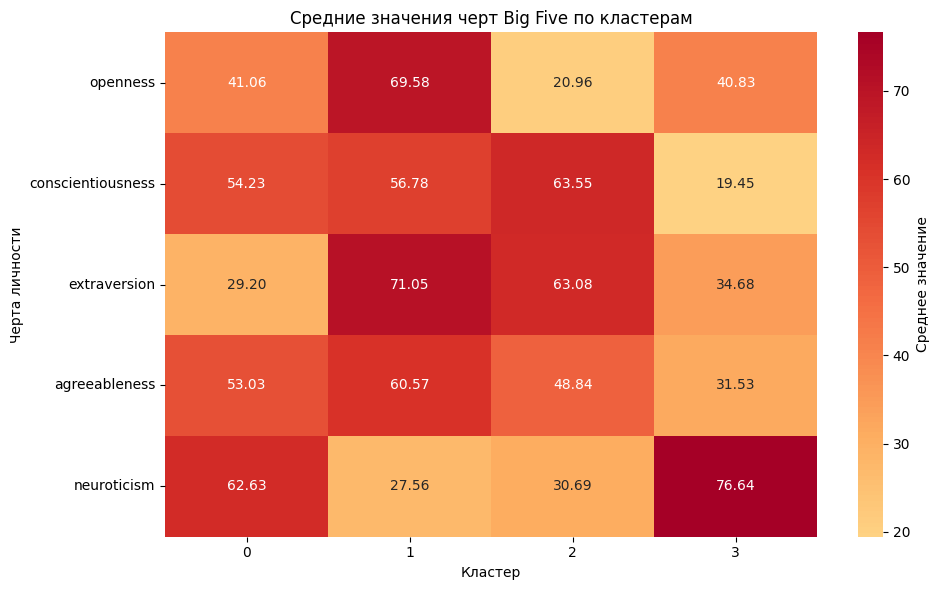

In [34]:
# Вычисляем средние значения
cluster_means = hier_model_five.groupby('hier_clusters').mean()

# Визуализация heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(
    cluster_means.T, 
    annot=True, 
    fmt='.2f', 
    cmap='RdYlBu_r',
    center=0,
    cbar_kws={'label': 'Среднее значение'}
)
plt.title('Средние значения черт Big Five по кластерам')
plt.xlabel('Кластер')
plt.ylabel('Черта личности')
plt.tight_layout()
plt.show()

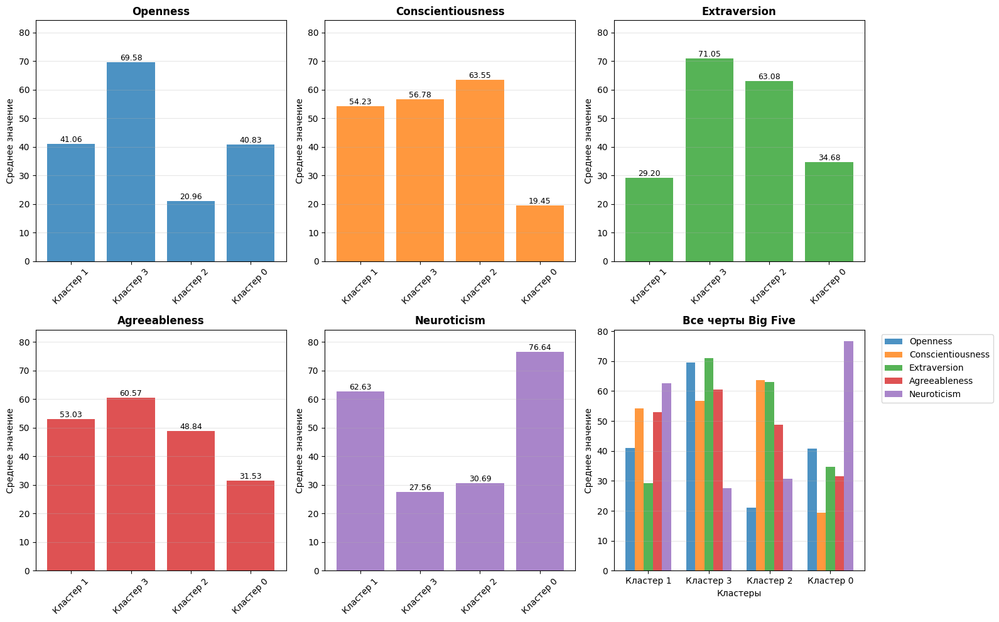

In [35]:
# Создаем сетку графиков
fig, axes = plt.subplots(2, 3, figsize=(16, 10))
axes = axes.flatten()

traits = ['openness', 'conscientiousness', 'extraversion', 
          'agreeableness', 'neuroticism', 'Все черты']
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']

for i, trait in enumerate(traits[:-1]):  # Последний для общего
    ax = axes[i]
    values = cluster_means[trait].values
    bars = ax.bar([f'Кластер {c}' for c in clusters], values, 
                  color=colors[i], alpha=0.8)
    
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.2f}', ha='center', va='bottom', fontsize=9)
    
    ax.set_title(f'{trait.capitalize()}', fontsize=12, fontweight='bold')
    ax.set_ylabel('Среднее значение')
    ax.set_ylim(0, cluster_means.values.max() * 1.1)
    ax.grid(True, alpha=0.3, axis='y')
    ax.tick_params(axis='x', rotation=45)

ax = axes[-1]
x = np.arange(len(clusters))
width = 0.15

for j, trait in enumerate(traits[:-1]):
    values = cluster_means[trait].values
    ax.bar(x + j*width, values, width, label=trait.capitalize(), 
           color=colors[j], alpha=0.8)

ax.set_xlabel('Кластеры')
ax.set_ylabel('Среднее значение')
ax.set_title('Все черты Big Five', fontsize=12, fontweight='bold')
ax.set_xticks(x + width * 2)
ax.set_xticklabels([f'Кластер {c}' for c in clusters])
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
ax.grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.show()

Строим дендрограмму на подвыборке 1000 точек...


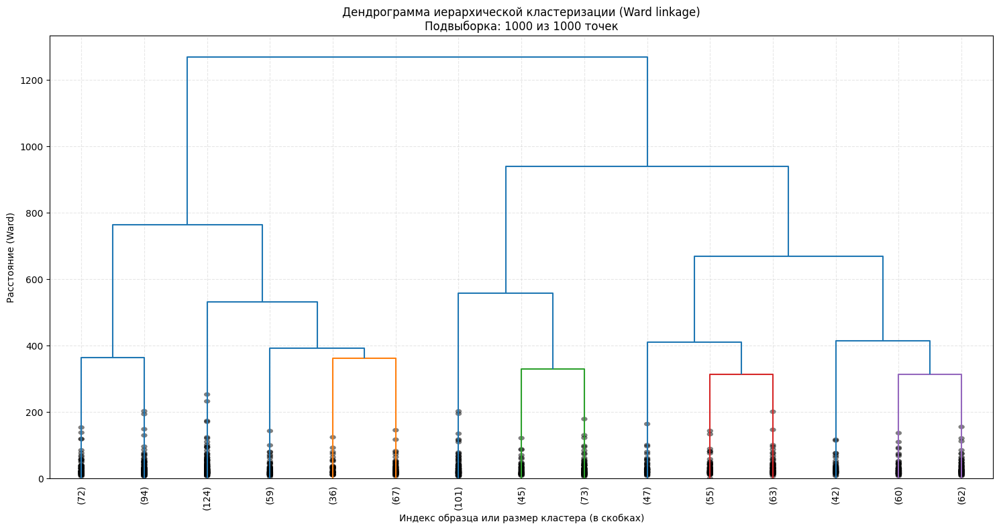

In [26]:
# Для дендрограммы берем подвыборку (500-1000 точек для читаемости)
sample_size = min(1000, len(hier_model_five))
print(f"Строим дендрограмму на подвыборке {sample_size} точек...")

# Случайная подвыборка
np.random.seed(42)
sample_indices = np.random.choice(len(hier_model_five), size=sample_size, replace=False)
sample_data = hier_model_five.iloc[sample_indices].values

# Вычисляем матрицу связей для дендрограммы
linkage_matrix = linkage(sample_data, method='ward')

# Строим дендрограмму
plt.figure(figsize=(15, 8))

# Основная дендрограмма
dendrogram(
    linkage_matrix,
    truncate_mode='lastp',  # показываем только последние p кластеров
    p=15,                   # показываем последние 15 слияний
    show_leaf_counts=True,
    leaf_rotation=90,
    leaf_font_size=10,
    show_contracted=True,
    color_threshold=linkage_matrix[-10, 2]  # цветовой порог для выделения
)

plt.title(f'Дендрограмма иерархической кластеризации (Ward linkage)\n'
          f'Подвыборка: {sample_size} из {len(hier_model_five)} точек')
plt.xlabel('Индекс образца или размер кластера (в скобках)')
plt.ylabel('Расстояние (Ward)')
plt.grid(True, alpha=0.3, linestyle='--')
plt.tight_layout()
plt.show()

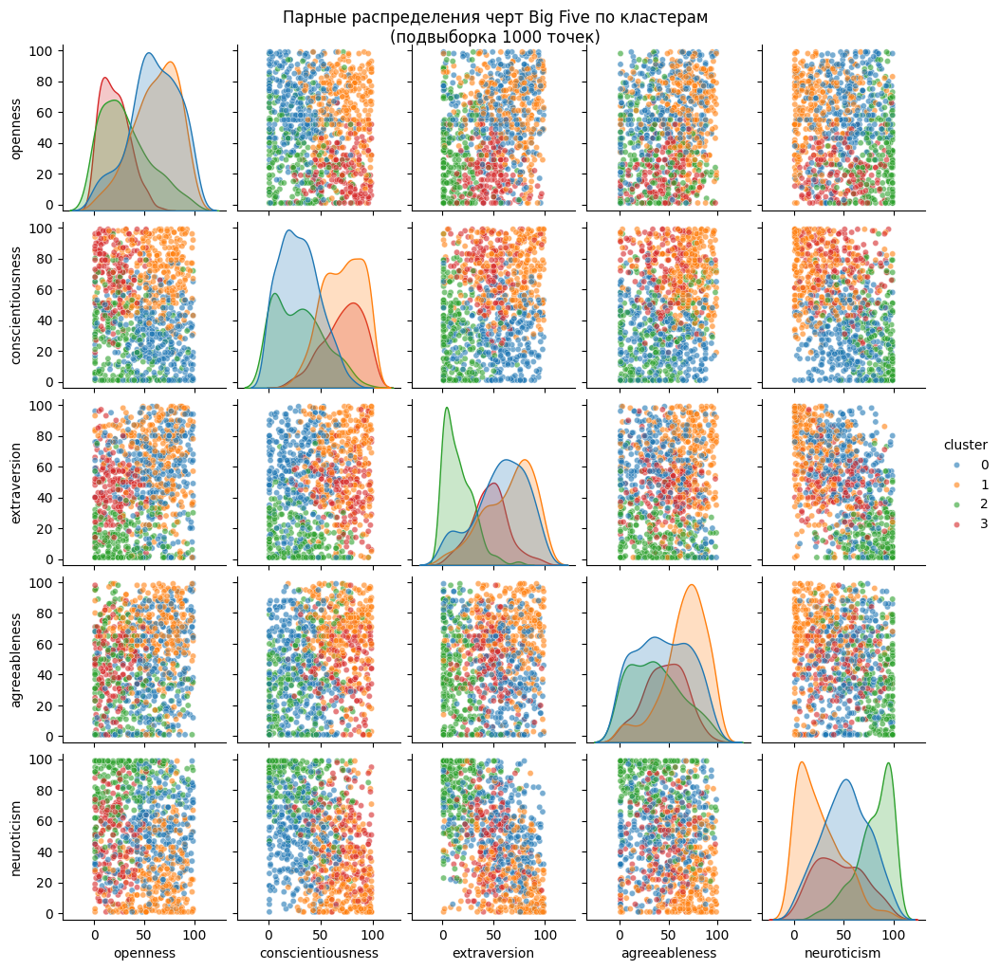

In [27]:
# Создаем DataFrame с кластерами для визуализации
viz_df = hier_model_five.copy()
viz_df['cluster'] = hier_predictions

# Берем подвыборку для парных диаграмм (для скорости)
sample_viz = viz_df.sample(n=1000, random_state=42)

# Парные диаграммы рассеяния
g = sns.pairplot(
    sample_viz,
    vars=['openness', 'conscientiousness', 'extraversion', 
          'agreeableness', 'neuroticism'],
    hue='cluster',
    palette='tab10',
    plot_kws={'alpha': 0.6, 's': 20},
    diag_kind='kde',
    height=2
)
g.fig.suptitle('Парные распределения черт Big Five по кластерам\n'
               '(подвыборка 1000 точек)', y=1.02)
plt.show()


### Latent profile analysis (LPA)

Latent Profile Analysis (Gaussian Mixture Model)...
Оптимальное количество профилей: 7


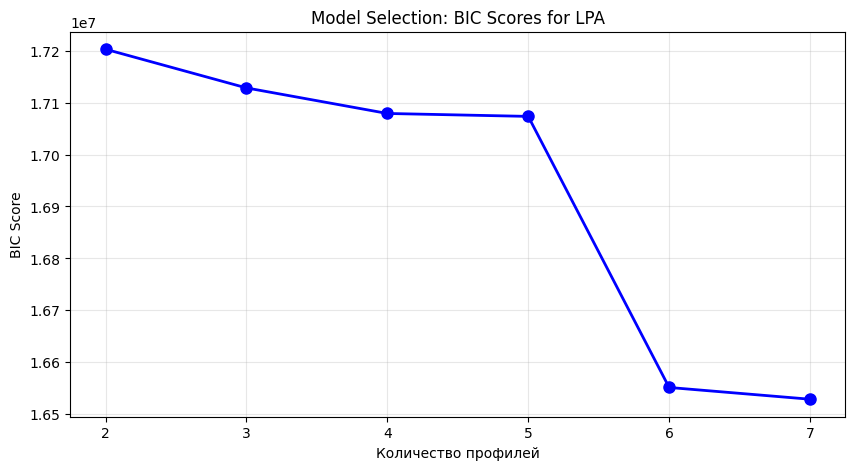

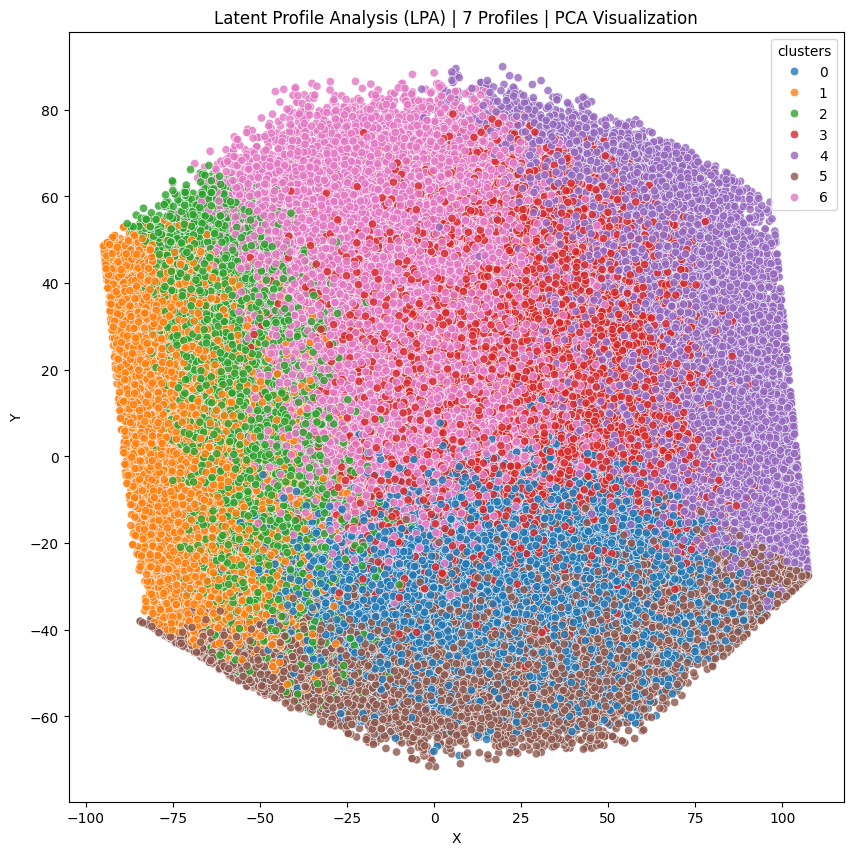


Профили (средние значения):
                   Profile 0  Profile 1  Profile 2  Profile 3  Profile 4  \
openness           12.932338  44.789432  47.960688  55.644082  47.247181   
conscientiousness  54.851856  93.988350  77.794669  51.385667   8.305488   
extraversion       47.078586  72.567146  75.437090  23.367662  31.316592   
agreeableness      45.857765  80.959275  58.681732  52.108084  35.467468   
neuroticism        48.707791  13.550689  10.976526  54.874371  87.975550   

                   Profile 5  Profile 6  
openness            1.000000  57.181037  
conscientiousness  59.901679  48.211595  
extraversion       43.543705  72.138318  
agreeableness      42.585312  50.567186  
neuroticism        47.116847  43.301496  


In [36]:
from sklearn.mixture import GaussianMixture
from scipy.stats import norm

print("Latent Profile Analysis (Gaussian Mixture Model)...")

# Подбираем оптимальное количество профилей по BIC
bic_scores = []
n_profiles_range = range(2, 8)

for n_profiles in n_profiles_range:
    gmm = GaussianMixture(n_components=n_profiles, random_state=random_state, n_init=10)
    gmm.fit(model_five)
    bic_scores.append(gmm.bic(model_five))

optimal_n = n_profiles_range[np.argmin(bic_scores)]
print(f"Оптимальное количество профилей: {optimal_n}")

# График BIC
plt.figure(figsize=(10, 5))
plt.plot(n_profiles_range, bic_scores, 'bo-', linewidth=2, markersize=8)
plt.xlabel('Количество профилей')
plt.ylabel('BIC Score')
plt.title('Model Selection: BIC Scores for LPA')
plt.grid(True, alpha=0.3)
plt.show()

# Финальная модель
gmm_final = GaussianMixture(n_components=optimal_n, random_state=random_state, n_init=20)
lpa_predictions = gmm_final.fit_predict(model_five)
lpa_proba = gmm_final.predict_proba(model_five)

# Визуализируем с PCA
pca_lpa = PCA(n_components=2)
df_lpa_pca = pd.DataFrame(
    data=pca_lpa.fit_transform(model_five),
    columns=["X", "Y"]
)
df_lpa_pca["clusters"] = lpa_predictions

plt.figure(figsize=(10, 10))
sns.scatterplot(
    data=df_lpa_pca, x="X", y="Y", hue="clusters", legend="full", palette="tab10", alpha=0.8
)
plt.title(f"Latent Profile Analysis (LPA) | {optimal_n} Profiles | PCA Visualization")
plt.show()

# Статистика по профилям
print("\nПрофили (средние значения):")
profile_stats = pd.DataFrame()
for i in range(optimal_n):
    profile_mask = lpa_predictions == i
    profile_stats[f"Profile {i}"] = model_five[profile_mask].mean()

print(profile_stats)

In [37]:
# Финальная модель
gmm_final = GaussianMixture(n_components=5, random_state=random_state, n_init=20)
lpa_predictions = gmm_final.fit_predict(model_five)
lpa_proba = gmm_final.predict_proba(model_five)

# Визуализируем с PCA
pca_lpa = PCA(n_components=2)
df_lpa_pca = pd.DataFrame(
    data=pca_lpa.fit_transform(model_five),
    columns=["X", "Y"]
)
df_lpa_pca["clusters"] = lpa_predictions

plt.figure(figsize=(10, 10))
sns.scatterplot(
    data=df_lpa_pca, x="X", y="Y", hue="clusters", legend="full", palette="tab10", alpha=0.8
)
plt.title(f"Latent Profile Analysis (LPA) | {5} Profiles | PCA Visualization")
plt.show()

# Статистика по профилям
print("\nПрофили (средние значения):")
profile_stats = pd.DataFrame()
for i in range(5):
    profile_mask = lpa_predictions == i
    profile_stats[f"Profile {i}"] = model_five[profile_mask].mean()

print(profile_stats)

KeyboardInterrupt: 

## На результате аспектов личности

In [38]:
X = df_ipipneo_120.copy()

O = X.filter(
    [
        "facet_imagination",
        "facet_artistic_interests",
        "facet_emotionality",
        "facet_adventurousness",
        "facet_intellect",
        "facet_liberalism",
    ]
)
C = X.filter(
    [
        "facet_self_efficacy",
        "facet_orderliness",
        "facet_dutifulness",
        "facet_achievement_striving",
        "facet_self_discipline",
        "facet_cautiousness",
    ]
)
E = X.filter(
    [
        "facet_friendliness",
        "facet_gregariousness",
        "facet_assertiveness",
        "facet_activity_level",
        "facet_excitement_seeking",
        "facet_cheerfulness",
    ]
)
A = X.filter(
    [
        "facet_trust",
        "facet_morality",
        "facet_altruism",
        "facet_cooperation",
        "facet_modesty",
        "facet_sympathy",
    ]
)
N = X.filter(
    [
        "facet_anxiety",
        "facet_anger",
        "facet_depression",
        "facet_self_consciousness",
        "facet_immoderation",
        "facet_vulnerability",
    ]
)

model_facet = pd.concat([O, C, E, A, N], axis=1)
model_facet.head()

,facet_imagination,facet_artistic_interests,facet_emotionality,facet_adventurousness,facet_intellect,facet_liberalism,facet_self_efficacy,facet_orderliness,facet_dutifulness,facet_achievement_striving,facet_self_discipline,facet_cautiousness,facet_friendliness,facet_gregariousness,facet_assertiveness,facet_activity_level,facet_excitement_seeking,facet_cheerfulness,facet_trust,facet_morality,facet_altruism,facet_cooperation,facet_modesty,facet_sympathy,facet_anxiety,facet_anger,facet_depression,facet_self_consciousness,facet_immoderation,facet_vulnerability
0,75,40,73,71,59,36,59,32,54,63,41,84,74,65,77,12,23,66,73,72,67,76,74,77,27,11,58,39,96,11
1,64,61,31,88,57,92,89,68,44,16,84,67,77,94,47,96,87,5,13,83,89,4,69,67,58,89,89,57,1,80
2,53,45,3,90,74,90,93,24,14,80,99,74,70,86,39,92,73,65,7,7,2,3,24,12,33,86,29,7,6,15
3,8,60,49,81,86,25,84,65,78,82,83,60,74,81,96,97,23,56,27,72,54,52,38,41,12,57,18,8,44,5
4,53,61,44,41,47,69,49,52,44,16,43,42,49,59,37,41,22,88,83,58,66,82,50,55,21,7,26,38,62,53


### Kmeans

In [95]:
kmeans = KMeans(n_clusters=4, random_state=random_state)
kfit = kmeans.fit(model_facet)

predictions = kfit.labels_
model_facet["clusters"] = predictions
model_facet.head()

,facet_imagination,facet_artistic_interests,facet_emotionality,facet_adventurousness,facet_intellect,facet_liberalism,facet_self_efficacy,facet_orderliness,facet_dutifulness,facet_achievement_striving,facet_self_discipline,facet_cautiousness,facet_friendliness,facet_gregariousness,facet_assertiveness,facet_activity_level,facet_excitement_seeking,facet_cheerfulness,facet_trust,facet_morality,facet_altruism,facet_cooperation,facet_modesty,facet_sympathy,facet_anxiety,facet_anger,facet_depression,facet_self_consciousness,facet_immoderation,facet_vulnerability,clusters
0,75,40,73,71,59,36,59,32,54,63,41,84,74,65,77,12,23,66,73,72,67,76,74,77,27,11,58,39,96,11,3
1,64,61,31,88,57,92,89,68,44,16,84,67,77,94,47,96,87,5,13,83,89,4,69,67,58,89,89,57,1,80,2
2,53,45,3,90,74,90,93,24,14,80,99,74,70,86,39,92,73,65,7,7,2,3,24,12,33,86,29,7,6,15,2
3,8,60,49,81,86,25,84,65,78,82,83,60,74,81,96,97,23,56,27,72,54,52,38,41,12,57,18,8,44,5,3
4,53,61,44,41,47,69,49,52,44,16,43,42,49,59,37,41,22,88,83,58,66,82,50,55,21,7,26,38,62,53,2


In [124]:
# Статистика по кластерам
print("\nСтатистика кластеров:")
cluster_stats = model_facet.groupby('clusters').agg({
    'facet_imagination': ['mean', 'std'],
    'facet_artistic_interests': ['mean', 'std'],
    'facet_emotionality': ['mean', 'std'],
    'facet_adventurousness': ['mean', 'std'],
    'facet_intellect': ['mean', 'std'],
    'facet_liberalism': ['mean', 'std'],
    'facet_self_efficacy': ['mean', 'std'],
    'facet_orderliness': ['mean', 'std'],
    'facet_dutifulness': ['mean', 'std'],
    'facet_achievement_striving': ['mean', 'std'],
    'facet_self_discipline': ['mean', 'std'],
    'facet_cautiousness': ['mean', 'std'],
    'facet_friendliness': ['mean', 'std'],
    'facet_gregariousness': ['mean', 'std'],
    'facet_assertiveness': ['mean', 'std'],
    'facet_activity_level': ['mean', 'std'],
    'facet_excitement_seeking': ['mean', 'std'],
    'facet_cheerfulness': ['mean', 'std'],
    'facet_trust': ['mean', 'std'],
    'facet_morality': ['mean', 'std'],
    'facet_altruism': ['mean', 'std'],
    'facet_cooperation': ['mean', 'std'],
    'facet_modesty': ['mean', 'std'],
    'facet_sympathy': ['mean', 'std'],
    'facet_anxiety': ['mean', 'std'],
    'facet_anger': ['mean', 'std'],
    'facet_depression': ['mean', 'std'],
    'facet_self_consciousness': ['mean', 'std'],
    'facet_immoderation': ['mean', 'std'],
    'facet_vulnerability': ['mean', 'std'],
}).round(3)
cluster_stats


Статистика кластеров:


facet_imagination         facet_artistic_interests          \
                      mean     std                     mean     std   
clusters                                                              
0                   28.666  26.093                   34.685  27.101   
1                   51.290  27.699                   42.608  28.822   
2                   50.419  27.180                   43.351  28.742   
3                   36.523  28.254                   52.208  27.629   

         facet_emotionality         facet_adventurousness          \
                       mean     std                  mean     std   
clusters                                                            
0                    40.403  27.085                31.885  23.982   
1                    47.678  28.564                34.463  25.966   
2                    46.026  27.751                54.756  26.443   
3                    52.286  26.485                59.337  25.727   

         facet_intellect         facet_liberalism         facet_self_efficacy  \
                    mean     std             mean     std                mean   
clusters                                                                        
0                 36.759  27.734           39.422  27.905              59.650   
1                 41.636  29.317           52.020  28.447              27.923   
2                 43.366  29.004           51.033  27.956              50.346   
3                 52.759  27.438           43.879  29.103              74.081   

                 facet_orderliness         facet_dutifulness          \
             std              mean     std              mean     std   
clusters                                                               
0         23.295            65.491  26.541            64.918  21.681   
1         24.245            39.089  27.594            35.531  25.899   
2         24.925            42.305  27.602            35.383  22.990   
3         19.892            67.632  26.519            68.857  20.694   

         facet_achievement_striving         facet_self_discipline          \
                               mean     std                  mean     std   
clusters                                                                    
0                            60.550  23.615                63.458  22.458   
1                            30.864  25.523                26.617  21.205   
2                            43.473  25.864                46.177  24.416   
3                            71.685  19.572                76.701  19.450   

         facet_cautiousness         facet_friendliness          \
                       mean     std               mean     std   
clusters                                                         
0                    70.701  22.311             42.896  23.850   
1                    40.348  28.627             25.521  21.684   
2                    33.127  24.444             66.970  20.195   
3                    68.684  24.189             77.331  17.031   

         facet_gregariousness         facet_assertiveness          \
                         mean     std                mean     std   
clusters                                                            
0                      35.662  23.556              43.826  26.321   
1                      30.983  24.011              29.628  25.226   
2                      70.205  21.859              57.878  24.063   
3                      70.087  22.924              66.251  22.142   

         facet_activity_level         facet_excitement_seeking          \
                         mean     std                     mean     std   
clusters                                                                 
0                      50.945  27.285                   25.287  20.234   
1                      32.104  25.349                   39.654  27.042   
2                      51.986  26.802                   65.830  21.903   
3                      

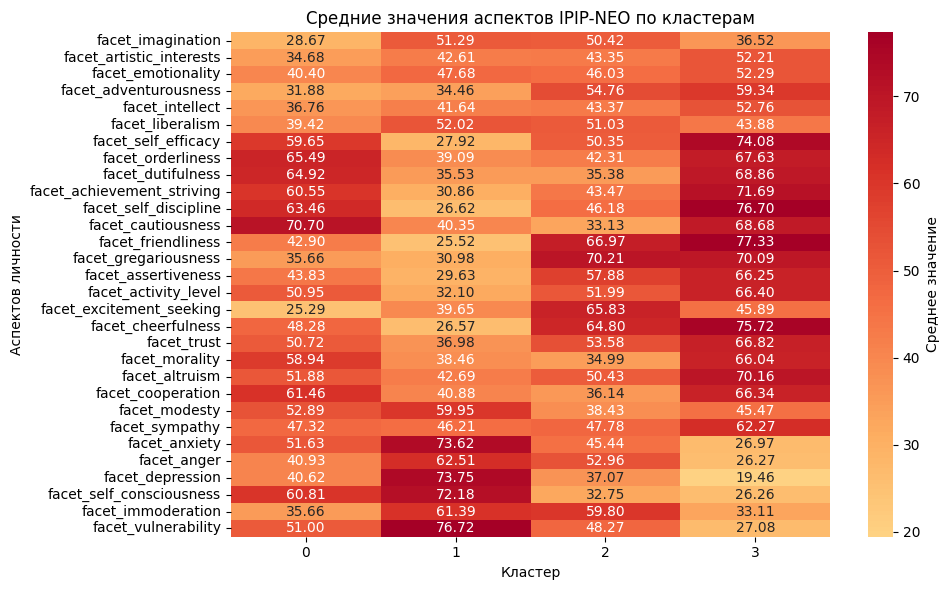

In [125]:
# Вычисляем средние значения
cluster_means = model_facet.groupby('clusters').mean()

# Визуализация heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(
    cluster_means.T, 
    annot=True, 
    fmt='.2f', 
    cmap='RdYlBu_r',
    center=0,
    cbar_kws={'label': 'Среднее значение'}
)
plt.title('Средние значения аспектов IPIP-NEO по кластерам')
plt.xlabel('Кластер')
plt.ylabel('Аспектов личности')
plt.tight_layout()
plt.show()


Статистика кластеров по граням личности:


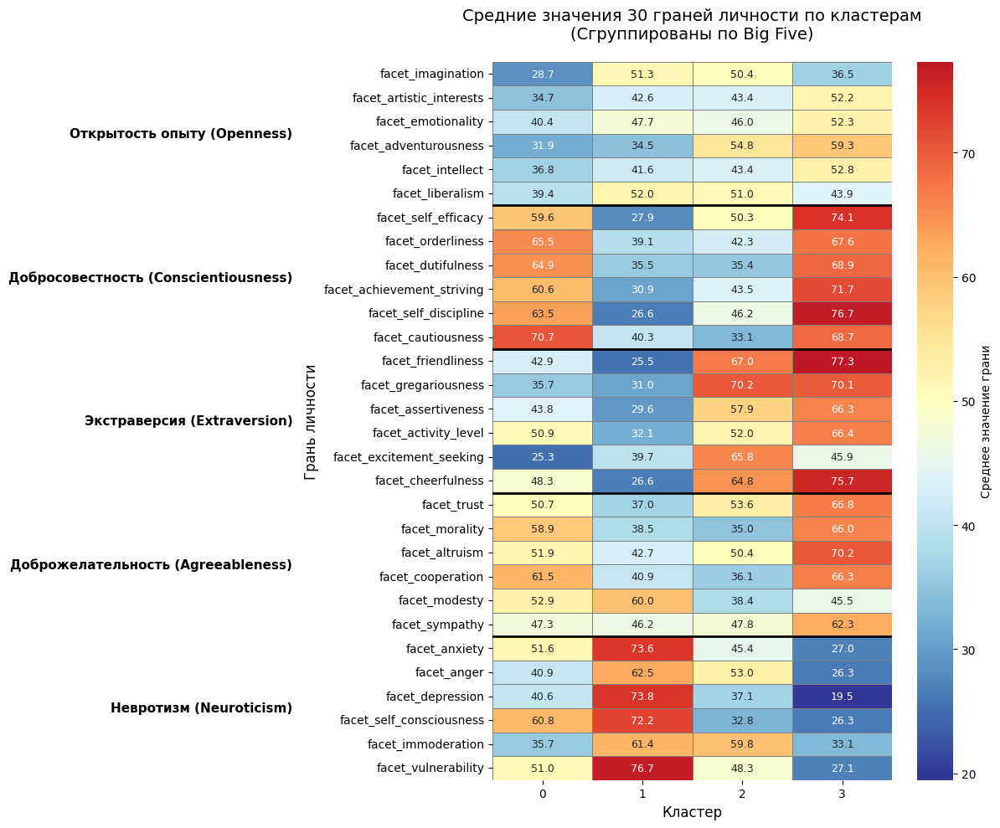


РЕЗЮМЕ ПО ОСНОВНЫМ ЧЕРТАМ

Средние значения по основным чертам:


,Открытость опыту (Openness),Добросовестность (Conscientiousness),Экстраверсия (Extraversion),Доброжелательность (Agreeableness),Невротизм (Neuroticism),count
clusters,,,,,,
0,35.30,64.13,41.15,53.87,46.77,107161
1,44.95,33.40,30.74,44.20,70.03,85261
2,48.16,41.80,62.94,43.56,46.05,108953
3,49.50,71.27,66.95,62.85,26.52,108793


<Figure size 1000x600 with 0 Axes>

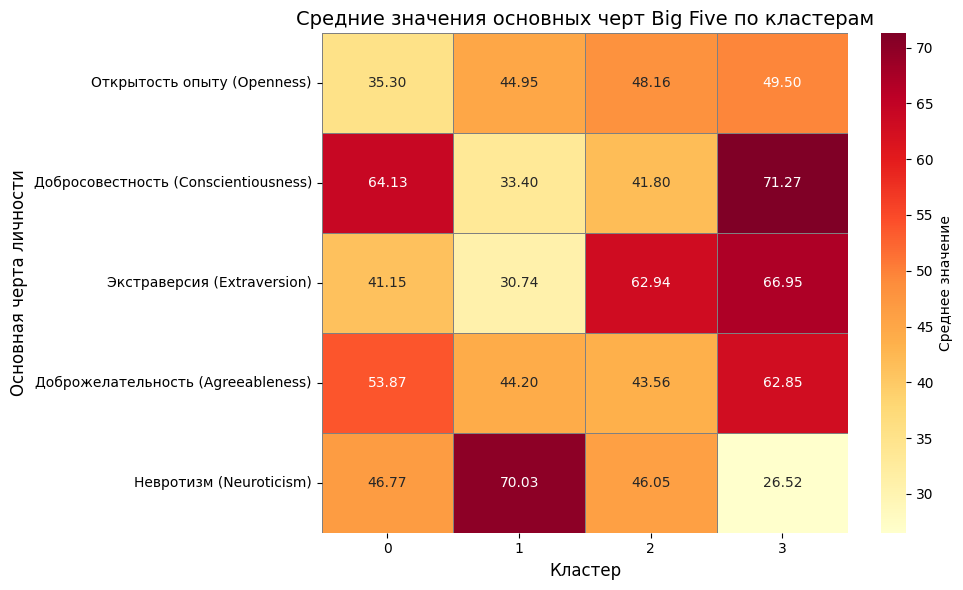


ДЕТАЛЬНАЯ СТАТИСТИКА КЛАСТЕРОВ

КЛАСТЕР 0 (107,161 точек, 26.1%):
----------------------------------------
Топ-5 граней с наивысшими значениями:
  cautiousness             :   70.7
  orderliness              :   65.5
  dutifulness              :   64.9
  self discipline          :   63.5
  cooperation              :   61.5

Топ-5 граней с наименьшими значениями:
  excitement seeking       :   25.3
  imagination              :   28.7
  adventurousness          :   31.9
  artistic interests       :   34.7
  gregariousness           :   35.7

КЛАСТЕР 1 (85,261 точек, 20.8%):
----------------------------------------
Топ-5 граней с наивысшими значениями:
  vulnerability            :   76.7
  depression               :   73.8
  anxiety                  :   73.6
  self consciousness       :   72.2
  anger                    :   62.5

Топ-5 граней с наименьшими значениями:
  friendliness             :   25.5
  cheerfulness             :   26.6
  self discipline          :   26.6
  self effica

In [126]:
# Статистика по кластерам для граней
print("\nСтатистика кластеров по граням личности:")
cluster_stats_facet = model_facet.groupby('clusters').agg({
    'facet_imagination': ['mean', 'std'],
    'facet_artistic_interests': ['mean', 'std'],
    'facet_emotionality': ['mean', 'std'],
    'facet_adventurousness': ['mean', 'std'],
    'facet_intellect': ['mean', 'std'],
    'facet_liberalism': ['mean', 'std'],
    'facet_self_efficacy': ['mean', 'std'],
    'facet_orderliness': ['mean', 'std'],
    'facet_dutifulness': ['mean', 'std'],
    'facet_achievement_striving': ['mean', 'std'],
    'facet_self_discipline': ['mean', 'std'],
    'facet_cautiousness': ['mean', 'std'],
    'facet_friendliness': ['mean', 'std'],
    'facet_gregariousness': ['mean', 'std'],
    'facet_assertiveness': ['mean', 'std'],
    'facet_activity_level': ['mean', 'std'],
    'facet_excitement_seeking': ['mean', 'std'],
    'facet_cheerfulness': ['mean', 'std'],
    'facet_trust': ['mean', 'std'],
    'facet_morality': ['mean', 'std'],
    'facet_altruism': ['mean', 'std'],
    'facet_cooperation': ['mean', 'std'],
    'facet_modesty': ['mean', 'std'],
    'facet_sympathy': ['mean', 'std'],
    'facet_anxiety': ['mean', 'std'],
    'facet_anger': ['mean', 'std'],
    'facet_depression': ['mean', 'std'],
    'facet_self_consciousness': ['mean', 'std'],
    'facet_immoderation': ['mean', 'std'],
    'facet_vulnerability': ['mean', 'std'],
}).round(3)

# Добавляем количество точек в каждом кластере
cluster_counts = model_facet.groupby('clusters').size()
cluster_stats_facet['count'] = cluster_counts

# Переименовываем колонки для лучшей читаемости
cluster_stats_facet.columns = [f'{col[0]}_{col[1]}' for col in cluster_stats_facet.columns]

# Визуализация тепловой карты с группировкой по основным чертам
# Создаем DataFrame со средними значениями
cluster_means_facet = cluster_stats_facet[[col for col in cluster_stats_facet.columns if '_mean' in col]]
cluster_means_facet.columns = [col.replace('_mean', '') for col in cluster_means_facet.columns]

# Группируем грани по основным чертам Big Five
big_five_facets = {
    'Открытость опыту (Openness)': [
        'facet_imagination',
        'facet_artistic_interests', 
        'facet_emotionality',
        'facet_adventurousness',
        'facet_intellect',
        'facet_liberalism'
    ],
    'Добросовестность (Conscientiousness)': [
        'facet_self_efficacy',
        'facet_orderliness',
        'facet_dutifulness',
        'facet_achievement_striving',
        'facet_self_discipline',
        'facet_cautiousness'
    ],
    'Экстраверсия (Extraversion)': [
        'facet_friendliness',
        'facet_gregariousness',
        'facet_assertiveness',
        'facet_activity_level',
        'facet_excitement_seeking',
        'facet_cheerfulness'
    ],
    'Доброжелательность (Agreeableness)': [
        'facet_trust',
        'facet_morality',
        'facet_altruism',
        'facet_cooperation',
        'facet_modesty',
        'facet_sympathy'
    ],
    'Невротизм (Neuroticism)': [
        'facet_anxiety',
        'facet_anger',
        'facet_depression',
        'facet_self_consciousness',
        'facet_immoderation',
        'facet_vulnerability'
    ]
}

# Создаем новый DataFrame с упорядоченными гранями
ordered_facets = []
for trait, facets in big_five_facets.items():
    ordered_facets.extend(facets)

# Фильтруем и переупорядочиваем данные
cluster_means_ordered = cluster_means_facet[ordered_facets]

# Визуализация тепловой карты с группировкой
plt.figure(figsize=(14, 10))

# Создаем маску для разделительных линий между чертами
mask = np.zeros_like(cluster_means_ordered.T, dtype=bool)
line_positions = [6, 12, 18, 24]  # Позиции после каждой черты (по 6 граней)
for pos in line_positions:
    if pos < mask.shape[0]:
        mask[pos:, :] = True

# Создаем аннотации
annot_data = cluster_means_ordered.T.round(1)

# Рисуем тепловую карту
sns.heatmap(
    cluster_means_ordered.T, 
    annot=annot_data,
    fmt='.1f', 
    cmap='RdYlBu_r',
    center=50,  # Центр шкалы на 50 (среднее значение)
    cbar_kws={'label': 'Среднее значение грани'},
    linewidths=0.5,
    linecolor='gray',
    mask=None,
    annot_kws={'size': 9}
)

# Добавляем вертикальные разделительные линии между чертами
ax = plt.gca()
for pos in line_positions:
    if pos < cluster_means_ordered.T.shape[0]:
        ax.axhline(pos, color='black', linewidth=2)

# Добавляем подписи для основных черт
y_positions = [3, 9, 15, 21, 27]  # Середины каждой группы граней
trait_labels = list(big_five_facets.keys())

for y_pos, label in zip(y_positions, trait_labels):
    plt.text(
        -0.5, y_pos, label, 
        fontsize=11, fontweight='bold',
        ha='right', va='center',
        transform=plt.gca().get_yaxis_transform()
    )

plt.title('Средние значения 30 граней личности по кластерам\n(Сгруппированы по Big Five)', 
          fontsize=14, pad=20)
plt.xlabel('Кластер', fontsize=12)
plt.ylabel('Грань личности', fontsize=12)
plt.yticks(rotation=0)

plt.tight_layout()
plt.show()

# Дополнительная визуализация: средние по основным чертам
print("\n" + "="*60)
print("РЕЗЮМЕ ПО ОСНОВНЫМ ЧЕРТАМ")
print("="*60)

# Вычисляем средние по основным чертам
big_five_means = pd.DataFrame()

for trait, facets in big_five_facets.items():
    # Берем только средние значения для соответствующих граней
    trait_means = cluster_means_facet[facets].mean(axis=1)
    big_five_means[trait] = trait_means

# Добавляем количество точек
big_five_means['count'] = cluster_counts

# Выводим таблицу
print("\nСредние значения по основным чертам:")
display(big_five_means.round(2))

# Визуализация тепловой карты для основных черт
plt.figure(figsize=(10, 6))

# Визуализация тепловой карты для основных черт с красно-желтой палитрой
plt.figure(figsize=(10, 6))

sns.heatmap(
    big_five_means.drop('count', axis=1).T, 
    annot=True,
    fmt='.2f', 
    cmap='YlOrRd',  # Красно-желтая палитра
    # или можно использовать другие варианты:
    # cmap='Oranges' - оранжевая палитра
    # cmap='Reds' - красная палитра
    # cmap='hot' - горячая палитра (черно-красно-желтая)
    # cmap='afmhot' - горячая палитра
    center=None,  # Убираем center, так как палитра не симметричная
    cbar_kws={'label': 'Среднее значение'},
    linewidths=0.5,
    linecolor='gray'
)

plt.title('Средние значения основных черт Big Five по кластерам', fontsize=14)
plt.xlabel('Кластер', fontsize=12)
plt.ylabel('Основная черта личности', fontsize=12)
plt.tight_layout()
plt.show()

# Статистика по кластерам
print("\n" + "="*60)
print("ДЕТАЛЬНАЯ СТАТИСТИКА КЛАСТЕРОВ")
print("="*60)

for cluster_id in sorted(model_facet['clusters'].unique()):
    cluster_size = len(model_facet[model_facet['clusters'] == cluster_id])
    percentage = cluster_size / len(model_facet) * 100
    
    print(f"\nКЛАСТЕР {cluster_id} ({cluster_size:,} точек, {percentage:.1f}%):")
    print("-" * 40)
    
    # Находим топ-5 граней с наивысшими значениями
    cluster_data = cluster_means_facet.loc[cluster_id]
    top_facets = cluster_data.nlargest(5)
    
    print("Топ-5 граней с наивысшими значениями:")
    for facet, value in top_facets.items():
        # Убираем префикс 'facet_' для лучшей читаемости
        facet_name = facet.replace('facet_', '').replace('_', ' ')
        print(f"  {facet_name:25}: {value:6.1f}")
    
    # Находим топ-5 граней с наименьшими значениями
    bottom_facets = cluster_data.nsmallest(5)
    
    print("\nТоп-5 граней с наименьшими значениями:")
    for facet, value in bottom_facets.items():
        facet_name = facet.replace('facet_', '').replace('_', ' ')
        print(f"  {facet_name:25}: {value:6.1f}")

#### PCA

##### PCA=2

In [98]:
pca = PCA(n_components=2)

df_pca = pd.DataFrame(data=pca.fit_transform(model_facet), columns=["X", "Y"])
df_pca["clusters"] = predictions

df_pca.head()

,X,Y,clusters
0,-35.906083,10.145076,3
1,7.929684,27.722076,2
2,-33.430345,75.061786,2
3,-102.110373,9.094792,3
4,-14.805034,10.041164,2


In [99]:
# Вычисляем центроиды кластеров в PCA пространстве
centroids = []
for cluster_id in sorted(df_pca['clusters'].unique()):
    cluster_data = df_pca[df_pca['clusters'] == cluster_id]
    centroid = cluster_data[['X', 'Y']].mean()
    centroids.append({
        'cluster': cluster_id,
        'X': centroid['X'],
        'Y': centroid['Y'],
        'size': len(cluster_data)
    })

centroids_df = pd.DataFrame(centroids)

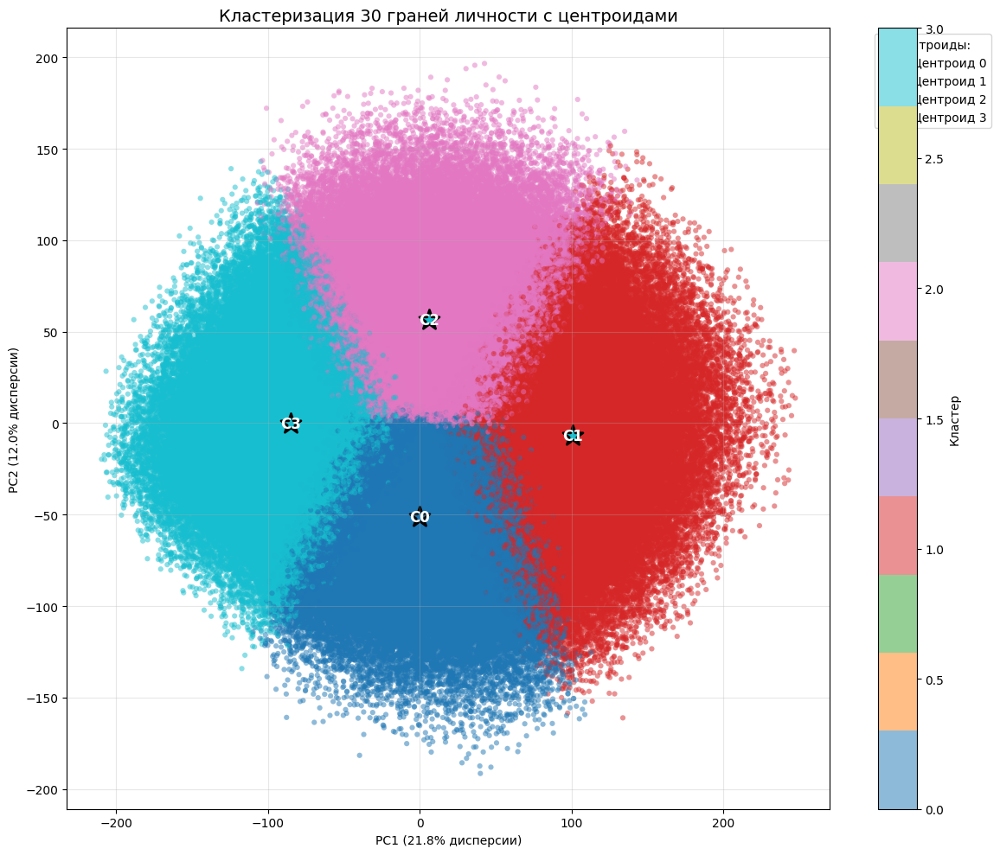

In [100]:
# Визуализация с центроидами
plt.figure(figsize=(12, 10))

# 1. Рисуем точки данных
scatter = plt.scatter(
    df_pca["X"], 
    df_pca["Y"], 
    c=df_pca["clusters"], 
    cmap='tab10', 
    alpha=0.5, 
    s=20,
    edgecolors='none'
)

# 2. Рисуем центроиды (крупнее и с обводкой)
for _, centroid in centroids_df.iterrows():
    plt.scatter(
        centroid['X'], 
        centroid['Y'], 
        color=plt.cm.tab10(centroid['cluster'] % 10),
        s=300,                    # Большой размер
        marker='*',              # Звездочка
        edgecolors='black',      # Черная обводка
        linewidth=2,
        label=f'Центроид {int(centroid["cluster"])}'
    )
    
    # Подписываем центроиды
    plt.text(
        centroid['X'], 
        centroid['Y'], 
        f'C{int(centroid["cluster"])}', 
        fontsize=12, 
        fontweight='bold', 
        ha='center', 
        va='center',
        color='white'
    )

# Объясненная дисперсия
explained_variance = pca.explained_variance_ratio_
plt.xlabel(f"PC1 ({explained_variance[0]*100:.1f}% дисперсии)")
plt.ylabel(f"PC2 ({explained_variance[1]*100:.1f}% дисперсии)")

plt.title("Кластеризация 30 граней личности с центроидами", fontsize=14)
plt.colorbar(scatter, label='Кластер')
plt.legend(title="Центроиды:", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Cluster IPIP-NEO Facets | Visualized on PCA')

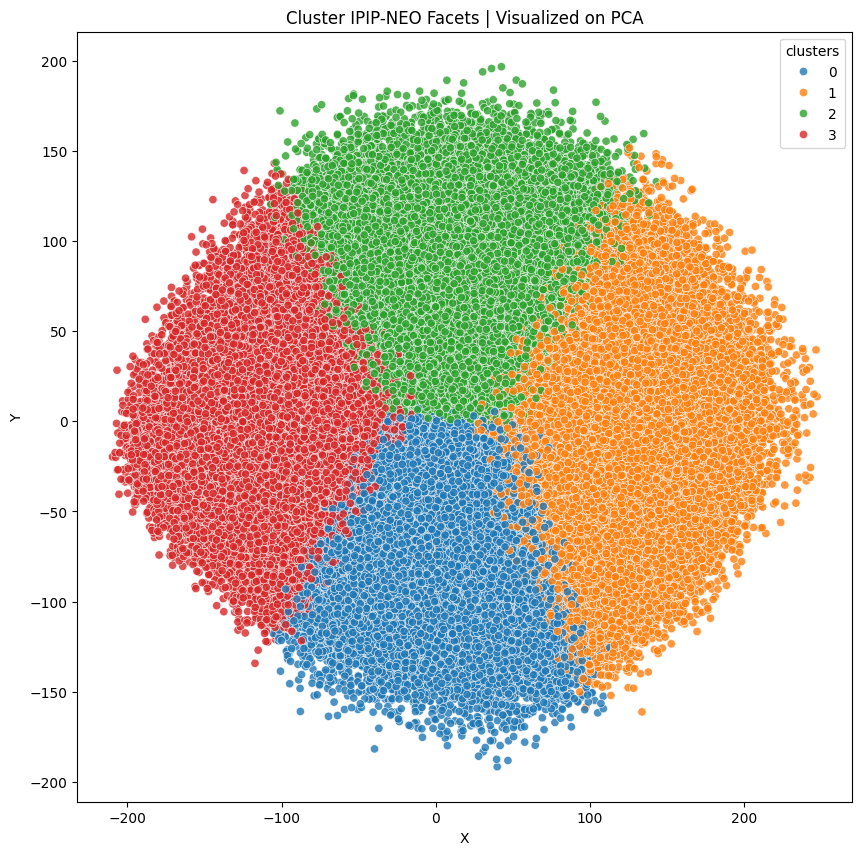

In [102]:
plt.figure(figsize=(10, 10))
sns.scatterplot(
    data=df_pca, x="X", y="Y", hue="clusters", legend="full", palette="tab10", alpha=0.8
)
plt.title("Cluster IPIP-NEO Facets | Visualized on PCA")

##### PCA=3

In [74]:
pca = PCA(n_components=3)

df_pca = pd.DataFrame(data=pca.fit_transform(model_facet), columns=["X", "Y", "Z"])
df_pca["clusters"] = predictions

df_pca.head()

,X,Y,Z,clusters
0,-35.894201,10.130826,62.293857,1
1,7.946186,27.732338,26.894976,3
2,-33.408423,75.089392,-75.031586,3
3,-102.101639,9.107019,-24.769634,1
4,-14.792219,10.060763,38.049161,3


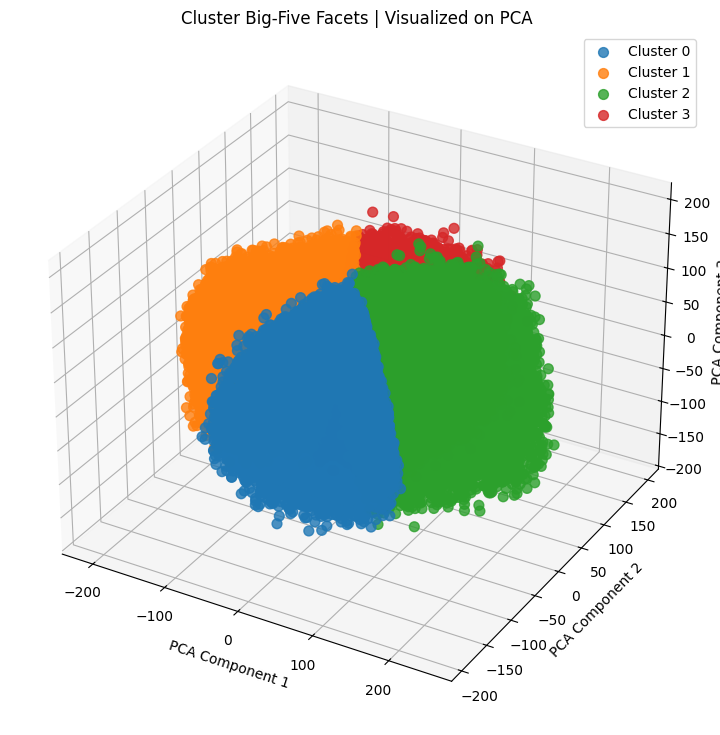

In [75]:
fig = plt.figure(figsize=(12, 9))
ax = fig.add_subplot(111, projection='3d')

# Получаем уникальные кластеры и цвета
clusters = df_pca['clusters'].unique()
colors = plt.cm.tab10(range(len(clusters)))

# Рисуем каждый кластер отдельно
for cluster, color in zip(sorted(clusters), colors):
    mask = df_pca['clusters'] == cluster
    ax.scatter(
        df_pca.loc[mask, 'X'],
        df_pca.loc[mask, 'Y'],
        df_pca.loc[mask, 'Z'],
        label=f'Cluster {cluster}',
        alpha=0.8,
        s=50,
        color=color
    )

ax.set_xlabel('PCA Component 1')
ax.set_ylabel('PCA Component 2')
ax.set_zlabel('PCA Component 3')
ax.set_title('Cluster Big-Five Facets | Visualized on PCA')
ax.legend()
plt.show()

#### UMAP

In [ ]:
mapper = umap.UMAP(n_components=2, random_state=random_state)
df_umap = pd.DataFrame(
    data=mapper.fit_transform(model_facet.drop('clusters', axis=1)),
    columns=["X", "Y"]
)
df_umap["clusters"] = model_facet["clusters"].values

plt.figure(figsize=(10, 10))
sns.scatterplot(
    data=df_umap, x="X", y="Y", hue="clusters", legend="full", palette="tab10", alpha=0.8
)
plt.title("Cluster Big-Five Facet | UMAP")
plt.show()

### AgglomerativeClustering

In [64]:
hier_model_five = model_facet.iloc[:10000]

In [65]:
hierarchical = AgglomerativeClustering(
    n_clusters=4, 
    linkage='ward',
    compute_distances=True  # для получения расстояний
)
hier_predictions = hierarchical.fit_predict(hier_model_five)


hier_model_five['hier_clusters'] = hier_predictions

#### PCA

Объясненная дисперсия PCA: PC1=0.207, PC2=0.127
Суммарная объясненная дисперсия: 0.335
Найдено кластеров: 4

ЦЕНТРОИДЫ КЛАСТЕРОВ В PCA ПРОСТРАНСТВЕ
Кластер 0: PC1=-63.621, PC2=-2.383
Кластер 1: PC1=105.795, PC2=-6.229
Кластер 2: PC1=14.262, PC2=48.916
Кластер 3: PC1=12.465, PC2=-57.881


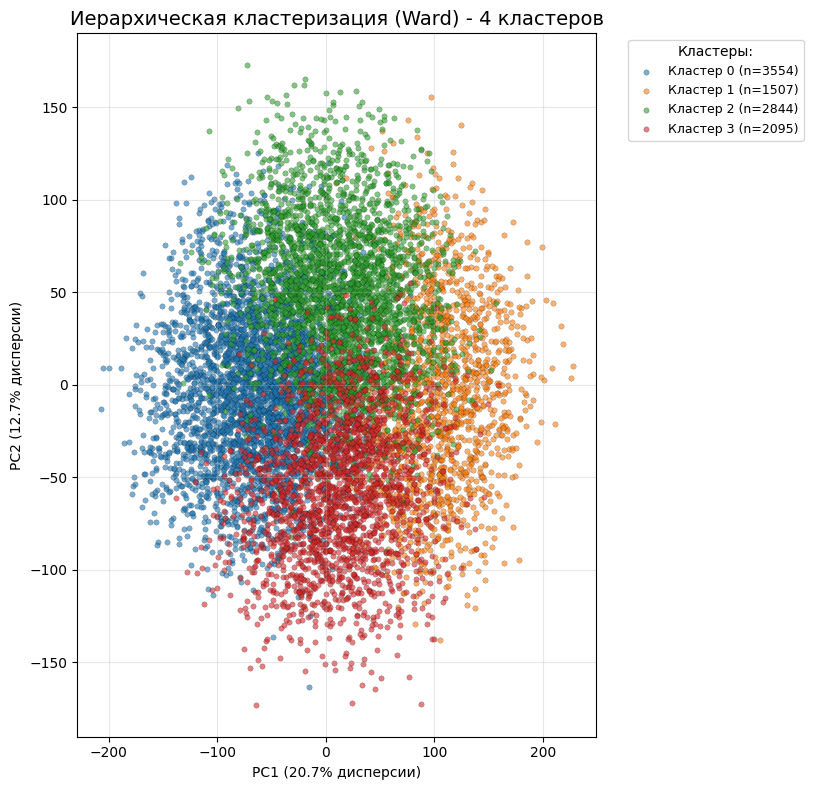

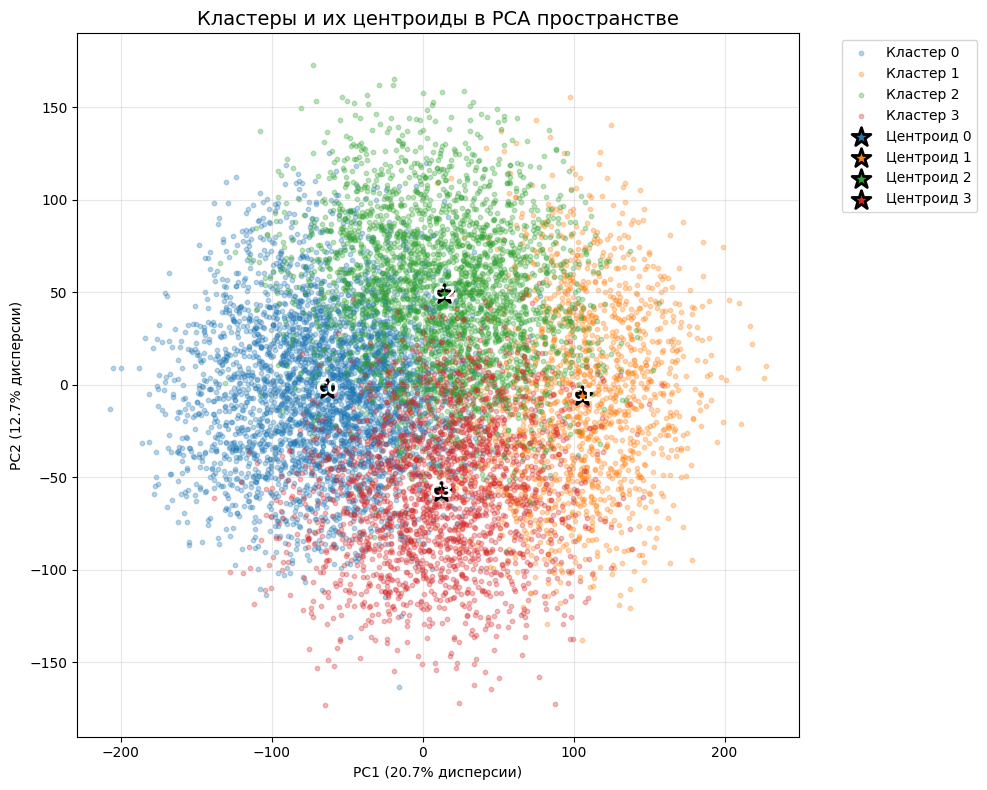

In [66]:
# Применяем PCA для уменьшения размерности до 2D
pca_hier = PCA(n_components=2)
X_pca = pca_hier.fit_transform(hier_model_five)

# Создаем DataFrame для визуализации
df_hier_pca = pd.DataFrame(
    data=X_pca,
    columns=["PC1", "PC2"]
)
df_hier_pca["clusters"] = hier_predictions
df_hier_pca["cluster_label"] = df_hier_pca["clusters"].astype(str)

# Объясненная дисперсия
explained_variance = pca_hier.explained_variance_ratio_
print(f"Объясненная дисперсия PCA: PC1={explained_variance[0]:.3f}, PC2={explained_variance[1]:.3f}")
print(f"Суммарная объясненная дисперсия: {sum(explained_variance):.3f}")

# Определяем количество уникальных кластеров
n_clusters = len(df_hier_pca['clusters'].unique())
print(f"Найдено кластеров: {n_clusters}")

# Визуализация PCA с дискретной цветовой схемой
plt.figure(figsize=(16, 8))

# Подграфик 1: PCA scatter plot с дискретными цветами
plt.subplot(1, 2, 1)

# Создаем цветовую карту для кластеров
# Используем tab10 для до 10 кластеров, tab20 для большего количества
if n_clusters <= 10:
    cmap = plt.cm.tab10
    colors = [cmap(i % 10) for i in range(n_clusters)]
else:
    cmap = plt.cm.tab20
    colors = [cmap(i % 20) for i in range(n_clusters)]

# Для каждого кластера рисуем отдельно с своим цветом
for cluster_id in sorted(df_hier_pca['clusters'].unique()):
    cluster_data = df_hier_pca[df_hier_pca['clusters'] == cluster_id]
    plt.scatter(
        cluster_data["PC1"], 
        cluster_data["PC2"], 
        color=colors[cluster_id % len(colors)], 
        alpha=0.6, 
        s=15,
        label=f'Кластер {cluster_id} (n={len(cluster_data)})',
        edgecolors='black',
        linewidth=0.2
    )

plt.xlabel(f"PC1 ({explained_variance[0]*100:.1f}% дисперсии)")
plt.ylabel(f"PC2 ({explained_variance[1]*100:.1f}% дисперсии)")
plt.title(f"Иерархическая кластеризация (Ward) - {n_clusters} кластеров", fontsize=14)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9, title="Кластеры:")
plt.grid(True, alpha=0.3)
plt.tight_layout(rect=[0, 0, 0.85, 1])

# Дополнительный анализ: центроиды кластеров в пространстве PCA
print("\n" + "="*60)
print("ЦЕНТРОИДЫ КЛАСТЕРОВ В PCA ПРОСТРАНСТВЕ")
print("="*60)

# Вычисляем центроиды
centroids = []
for cluster_id in sorted(df_hier_pca['clusters'].unique()):
    centroid = df_hier_pca[df_hier_pca['clusters'] == cluster_id][['PC1', 'PC2']].mean()
    centroids.append(centroid)
    print(f"Кластер {cluster_id}: PC1={centroid['PC1']:.3f}, PC2={centroid['PC2']:.3f}")

# Визуализация центроидов
plt.figure(figsize=(10, 8))

# Сначала точки кластеров
for cluster_id in sorted(df_hier_pca['clusters'].unique()):
    cluster_data = df_hier_pca[df_hier_pca['clusters'] == cluster_id]
    plt.scatter(
        cluster_data["PC1"], 
        cluster_data["PC2"], 
        color=colors[cluster_id % len(colors)], 
        alpha=0.3, 
        s=10,
        label=f'Кластер {cluster_id}'
    )

# Затем центроиды (крупнее и с обводкой)
for i, (centroid, cluster_id) in enumerate(zip(centroids, sorted(df_hier_pca['clusters'].unique()))):
    plt.scatter(
        centroid['PC1'], 
        centroid['PC2'], 
        color=colors[cluster_id % len(colors)], 
        s=200,
        marker='*',
        edgecolors='black',
        linewidth=2,
        label=f'Центроид {cluster_id}'
    )
    # Подписываем центроиды
    plt.text(centroid['PC1'], centroid['PC2'], f'C{cluster_id}', 
             fontsize=12, fontweight='bold', ha='center', va='center',
             color='white')

plt.xlabel(f"PC1 ({explained_variance[0]*100:.1f}% дисперсии)")
plt.ylabel(f"PC2 ({explained_variance[1]*100:.1f}% дисперсии)")
plt.title('Кластеры и их центроиды в PCA пространстве', fontsize=14)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

## На результате ответов личности

In [113]:
X = df_ipipneo_120.copy()
model_test = X.iloc[:, 10:130]
model_test.head()

,i1,i2,i3,i4,i5,i6,i7,i8,i9,i10,i11,i12,i13,i14,i15,i16,i17,i18,i19,i20,i21,i22,i23,i24,i25,i26,i27,i28,i29,i30,i31,i32,i33,i34,i35,i36,i37,i38,i39,i40,i41,i42,i43,i44,i45,i46,i47,i48,i49,i50,...,i71,i72,i73,i74,i75,i76,i77,i78,i79,i80,i81,i82,i83,i84,i85,i86,i87,i88,i89,i90,i91,i92,i93,i94,i95,i96,i97,i98,i99,i100,i101,i102,i103,i104,i105,i106,i107,i108,i109,i110,i111,i112,i113,i114,i115,i116,i117,i118,i119,i120
0,5,4,5,4,4,2,5,5,4,4,2,4,4,4,4,1,2,4,5,4,5,4,4,3,2,2,4,2,4,4,2,4,4,4,4,2,4,4,4,1,4,4,4,5,4,4,2,4,5,4,...,2,5,5,5,4,2,3,4,3,4,4,2,4,5,2,1,5,4,4,4,2,4,5,4,4,2,4,4,5,2,4,4,5,4,4,4,2,3,4,4,5,2,4,4,4,2,4,1,5,4
1,5,4,4,2,5,5,5,4,5,4,4,4,5,5,4,3,5,5,1,4,1,5,3,4,4,3,2,5,4,3,4,4,5,2,4,5,4,4,5,5,4,2,4,5,5,2,5,4,2,2,...,4,4,2,5,2,4,4,4,5,2,2,3,5,4,4,4,2,5,5,4,3,4,4,3,5,4,5,5,5,2,4,4,4,5,5,4,4,4,2,5,1,4,3,3,4,4,2,3,4,3
2,2,4,2,2,4,4,5,4,3,2,2,4,2,2,4,2,3,5,1,4,1,5,5,2,4,1,3,3,2,4,2,4,5,2,5,5,4,2,3,2,2,2,2,2,2,2,4,5,2,4,...,2,4,4,3,2,2,5,2,2,4,1,5,5,2,5,1,4,4,3,3,4,4,5,2,5,4,4,4,2,2,2,3,1,3,4,1,4,5,1,5,1,2,4,3,5,2,4,4,3,5
3,3,4,3,2,5,4,4,4,3,3,2,5,4,4,5,1,5,5,2,4,4,4,5,3,3,1,3,2,3,2,2,4,2,3,5,4,5,4,5,4,1,5,3,5,4,1,5,4,4,4,...,2,5,5,4,4,3,4,4,4,5,4,2,5,3,4,1,5,2,4,4,3,4,4,3,4,3,4,5,5,4,2,5,4,4,5,2,4,3,4,5,2,3,4,4,5,2,4,2,4,3
4,4,4,4,5,4,2,3,4,4,4,3,3,5,5,4,3,3,4,5,4,3,3,4,5,3,3,5,4,4,3,2,4,3,4,4,1,4,4,5,3,1,3,4,4,4,3,4,2,5,4,...,2,3,2,4,4,3,4,4,5,3,4,2,4,2,3,3,5,4,4,2,2,3,4,4,4,2,3,4,4,2,2,4,5,5,4,2,1,2,4,2,3,2,4,4,3,1,5,3,4,4


In [114]:
kmeans = KMeans(n_clusters=4, random_state=random_state)
kfit = kmeans.fit(model_test)

predictions = kfit.labels_
model_test["clusters"] = predictions
model_test.head()

,i1,i2,i3,i4,i5,i6,i7,i8,i9,i10,i11,i12,i13,i14,i15,i16,i17,i18,i19,i20,i21,i22,i23,i24,i25,i26,i27,i28,i29,i30,i31,i32,i33,i34,i35,i36,i37,i38,i39,i40,i41,i42,i43,i44,i45,i46,i47,i48,i49,i50,...,i72,i73,i74,i75,i76,i77,i78,i79,i80,i81,i82,i83,i84,i85,i86,i87,i88,i89,i90,i91,i92,i93,i94,i95,i96,i97,i98,i99,i100,i101,i102,i103,i104,i105,i106,i107,i108,i109,i110,i111,i112,i113,i114,i115,i116,i117,i118,i119,i120,clusters
0,5,4,5,4,4,2,5,5,4,4,2,4,4,4,4,1,2,4,5,4,5,4,4,3,2,2,4,2,4,4,2,4,4,4,4,2,4,4,4,1,4,4,4,5,4,4,2,4,5,4,...,5,5,5,4,2,3,4,3,4,4,2,4,5,2,1,5,4,4,4,2,4,5,4,4,2,4,4,5,2,4,4,5,4,4,4,2,3,4,4,5,2,4,4,4,2,4,1,5,4,3
1,5,4,4,2,5,5,5,4,5,4,4,4,5,5,4,3,5,5,1,4,1,5,3,4,4,3,2,5,4,3,4,4,5,2,4,5,4,4,5,5,4,2,4,5,5,2,5,4,2,2,...,4,2,5,2,4,4,4,5,2,2,3,5,4,4,4,2,5,5,4,3,4,4,3,5,4,5,5,5,2,4,4,4,5,5,4,4,4,2,5,1,4,3,3,4,4,2,3,4,3,2
2,2,4,2,2,4,4,5,4,3,2,2,4,2,2,4,2,3,5,1,4,1,5,5,2,4,1,3,3,2,4,2,4,5,2,5,5,4,2,3,2,2,2,2,2,2,2,4,5,2,4,...,4,4,3,2,2,5,2,2,4,1,5,5,2,5,1,4,4,3,3,4,4,5,2,5,4,4,4,2,2,2,3,1,3,4,1,4,5,1,5,1,2,4,3,5,2,4,4,3,5,2
3,3,4,3,2,5,4,4,4,3,3,2,5,4,4,5,1,5,5,2,4,4,4,5,3,3,1,3,2,3,2,2,4,2,3,5,4,5,4,5,4,1,5,3,5,4,1,5,4,4,4,...,5,5,4,4,3,4,4,4,5,4,2,5,3,4,1,5,2,4,4,3,4,4,3,4,3,4,5,5,4,2,5,4,4,5,2,4,3,4,5,2,3,4,4,5,2,4,2,4,3,3
4,4,4,4,5,4,2,3,4,4,4,3,3,5,5,4,3,3,4,5,4,3,3,4,5,3,3,5,4,4,3,2,4,3,4,4,1,4,4,5,3,1,3,4,4,4,3,4,2,5,4,...,3,2,4,4,3,4,4,5,3,4,2,4,2,3,3,5,4,4,2,2,3,4,4,4,2,3,4,4,2,2,4,5,5,4,2,1,2,4,2,3,2,4,4,3,1,5,3,4,4,3


#### PCA

##### PCA=2

In [115]:
pca = PCA(n_components=2)

df_pca = pd.DataFrame(data=pca.fit_transform(model_test), columns=["X", "Y"])
df_pca["clusters"] = predictions

df_pca.head()

,X,Y,clusters
0,-1.696268,0.903374,3
1,1.016470,1.492688,2
2,-0.766225,5.545633,2
3,-5.070016,2.242817,3
4,-2.038164,-0.232806,3


In [116]:
# Вычисляем центроиды кластеров в PCA пространстве
centroids = []
for cluster_id in sorted(df_pca['clusters'].unique()):
    cluster_data = df_pca[df_pca['clusters'] == cluster_id]
    centroid = cluster_data[['X', 'Y']].mean()
    centroids.append({
        'cluster': cluster_id,
        'X': centroid['X'],
        'Y': centroid['Y'],
        'size': len(cluster_data)
    })

centroids_df = pd.DataFrame(centroids)

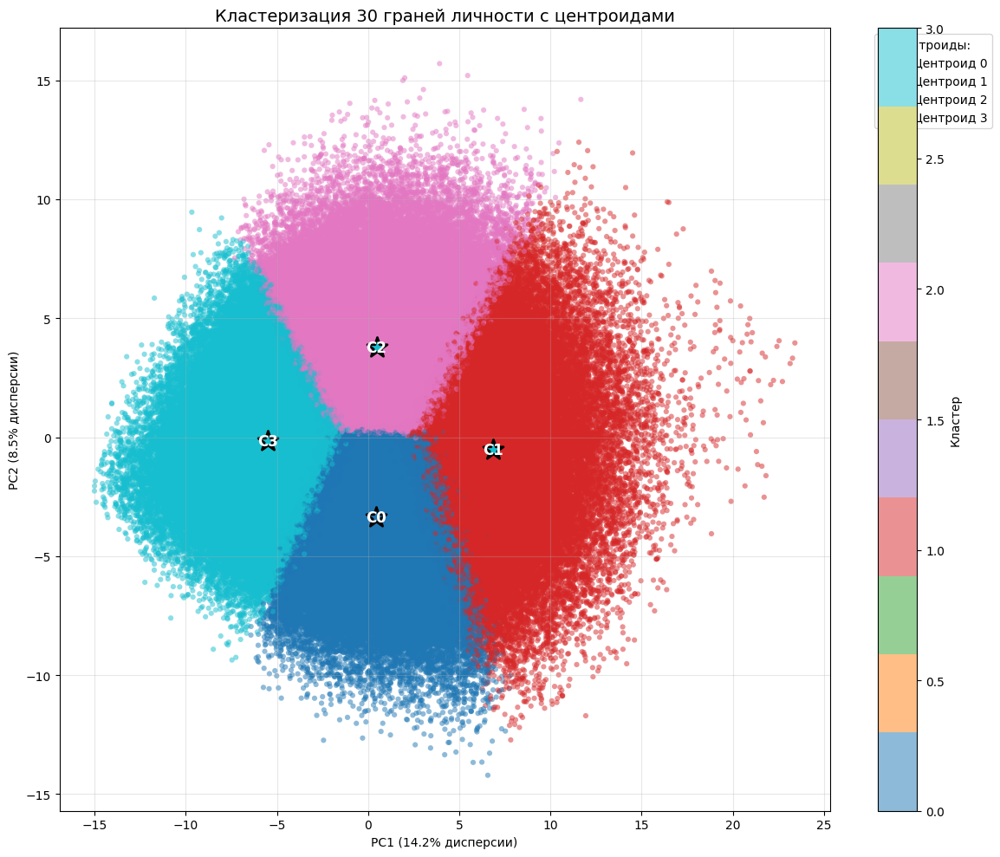

In [117]:
# Визуализация с центроидами
plt.figure(figsize=(12, 10))

# 1. Рисуем точки данных
scatter = plt.scatter(
    df_pca["X"], 
    df_pca["Y"], 
    c=df_pca["clusters"], 
    cmap='tab10', 
    alpha=0.5, 
    s=20,
    edgecolors='none'
)

# 2. Рисуем центроиды (крупнее и с обводкой)
for _, centroid in centroids_df.iterrows():
    plt.scatter(
        centroid['X'], 
        centroid['Y'], 
        color=plt.cm.tab10(centroid['cluster'] % 10),
        s=300,                    # Большой размер
        marker='*',              # Звездочка
        edgecolors='black',      # Черная обводка
        linewidth=2,
        label=f'Центроид {int(centroid["cluster"])}'
    )
    
    # Подписываем центроиды
    plt.text(
        centroid['X'], 
        centroid['Y'], 
        f'C{int(centroid["cluster"])}', 
        fontsize=12, 
        fontweight='bold', 
        ha='center', 
        va='center',
        color='white'
    )

# Объясненная дисперсия
explained_variance = pca.explained_variance_ratio_
plt.xlabel(f"PC1 ({explained_variance[0]*100:.1f}% дисперсии)")
plt.ylabel(f"PC2 ({explained_variance[1]*100:.1f}% дисперсии)")

plt.title("Кластеризация 30 граней личности с центроидами", fontsize=14)
plt.colorbar(scatter, label='Кластер')
plt.legend(title="Центроиды:", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Cluster Responses to IPIP-NEO120 | Visualized on PCA')

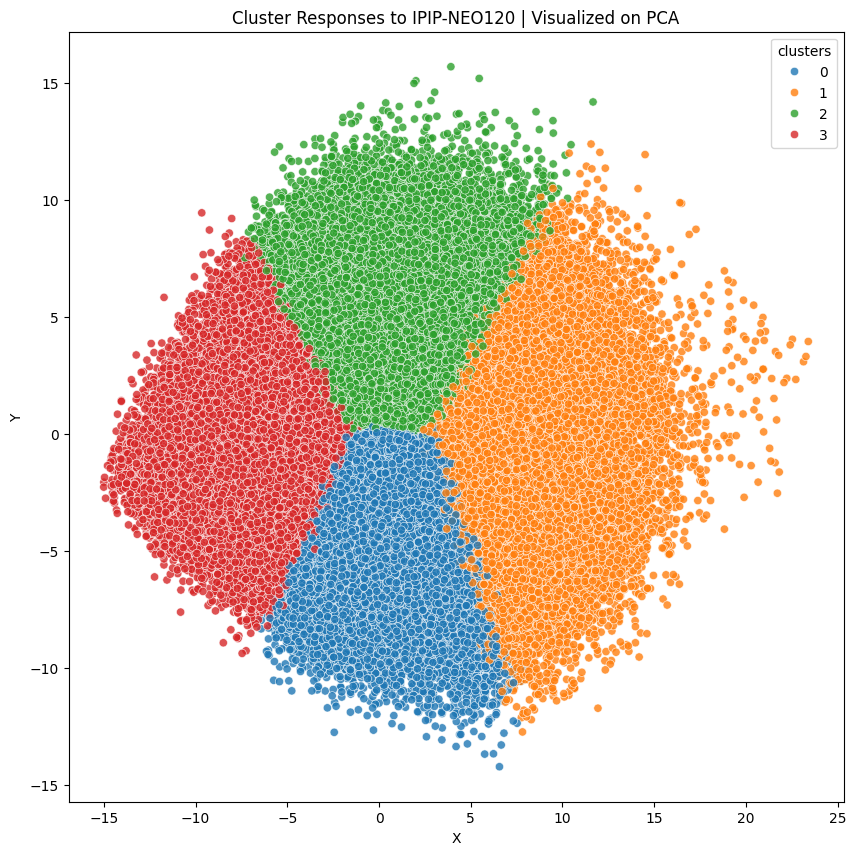

In [121]:
plt.figure(figsize=(10, 10))
sns.scatterplot(
    data=df_pca, x="X", y="Y", hue="clusters", legend="full", palette="tab10", alpha=0.8
)
plt.title("Cluster Responses to IPIP-NEO120 | Visualized on PCA")

### AgglomerativeClustering

In [119]:
hier_model_five = model_test.iloc[:10000]

In [120]:
hierarchical = AgglomerativeClustering(
    n_clusters=4, 
    linkage='ward',
    compute_distances=True  # для получения расстояний
)
hier_predictions = hierarchical.fit_predict(hier_model_five)


hier_model_five['hier_clusters'] = hier_predictions

#### PCA

Объясненная дисперсия PCA: PC1=0.132, PC2=0.091
Суммарная объясненная дисперсия: 0.224
Найдено кластеров: 4

ЦЕНТРОИДЫ КЛАСТЕРОВ В PCA ПРОСТРАНСТВЕ
Кластер 0: PC1=-3.712, PC2=0.491
Кластер 1: PC1=5.961, PC2=-0.454
Кластер 2: PC1=0.734, PC2=3.556
Кластер 3: PC1=0.853, PC2=-4.306


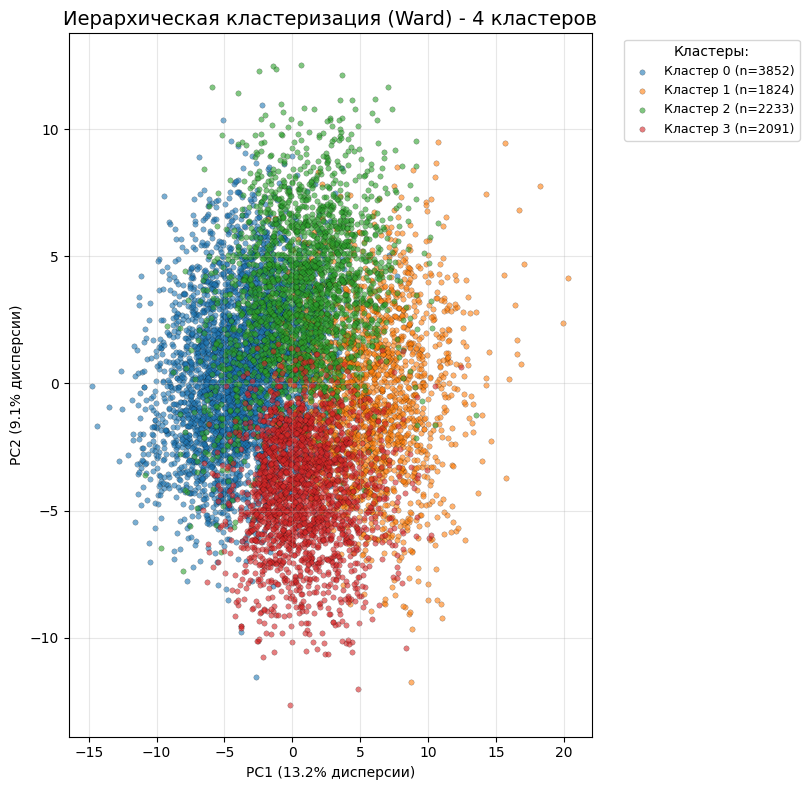

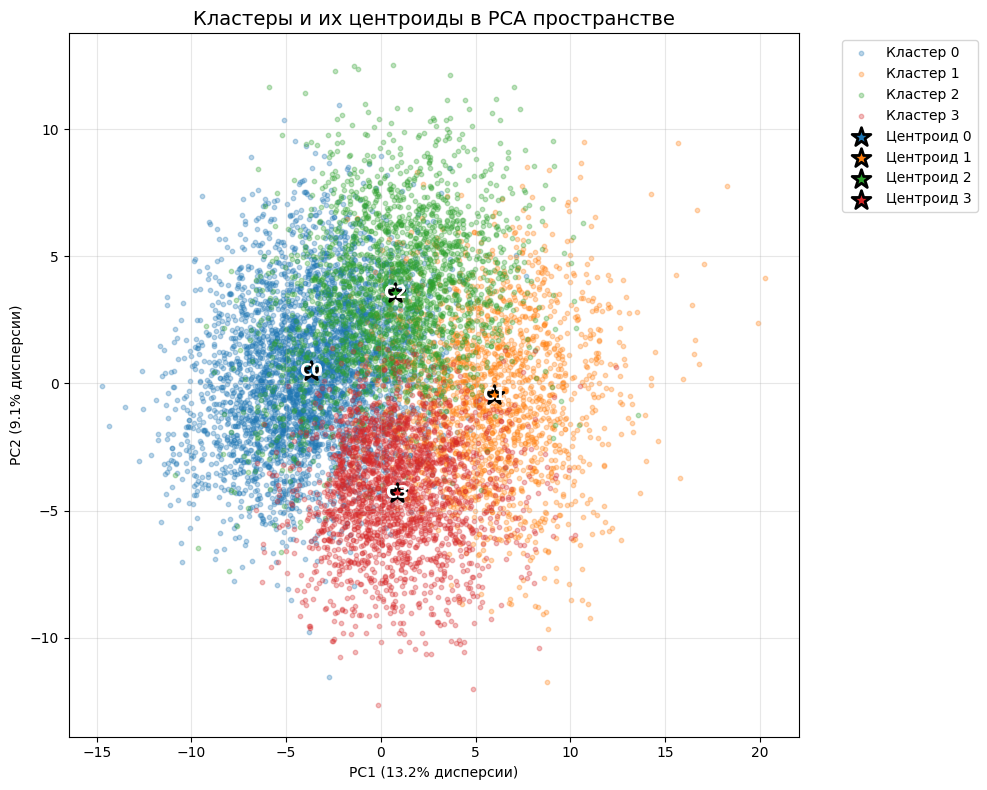

In [63]:
# Применяем PCA для уменьшения размерности до 2D
pca_hier = PCA(n_components=2)
X_pca = pca_hier.fit_transform(hier_model_five)

# Создаем DataFrame для визуализации
df_hier_pca = pd.DataFrame(
    data=X_pca,
    columns=["PC1", "PC2"]
)
df_hier_pca["clusters"] = hier_predictions
df_hier_pca["cluster_label"] = df_hier_pca["clusters"].astype(str)

# Объясненная дисперсия
explained_variance = pca_hier.explained_variance_ratio_
print(f"Объясненная дисперсия PCA: PC1={explained_variance[0]:.3f}, PC2={explained_variance[1]:.3f}")
print(f"Суммарная объясненная дисперсия: {sum(explained_variance):.3f}")

# Определяем количество уникальных кластеров
n_clusters = len(df_hier_pca['clusters'].unique())
print(f"Найдено кластеров: {n_clusters}")

# Визуализация PCA с дискретной цветовой схемой
plt.figure(figsize=(16, 8))

# Подграфик 1: PCA scatter plot с дискретными цветами
plt.subplot(1, 2, 1)

# Создаем цветовую карту для кластеров
# Используем tab10 для до 10 кластеров, tab20 для большего количества
if n_clusters <= 10:
    cmap = plt.cm.tab10
    colors = [cmap(i % 10) for i in range(n_clusters)]
else:
    cmap = plt.cm.tab20
    colors = [cmap(i % 20) for i in range(n_clusters)]

# Для каждого кластера рисуем отдельно с своим цветом
for cluster_id in sorted(df_hier_pca['clusters'].unique()):
    cluster_data = df_hier_pca[df_hier_pca['clusters'] == cluster_id]
    plt.scatter(
        cluster_data["PC1"], 
        cluster_data["PC2"], 
        color=colors[cluster_id % len(colors)], 
        alpha=0.6, 
        s=15,
        label=f'Кластер {cluster_id} (n={len(cluster_data)})',
        edgecolors='black',
        linewidth=0.2
    )

plt.xlabel(f"PC1 ({explained_variance[0]*100:.1f}% дисперсии)")
plt.ylabel(f"PC2 ({explained_variance[1]*100:.1f}% дисперсии)")
plt.title(f"Иерархическая кластеризация (Ward) - {n_clusters} кластеров", fontsize=14)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9, title="Кластеры:")
plt.grid(True, alpha=0.3)
plt.tight_layout(rect=[0, 0, 0.85, 1])

# Дополнительный анализ: центроиды кластеров в пространстве PCA
print("\n" + "="*60)
print("ЦЕНТРОИДЫ КЛАСТЕРОВ В PCA ПРОСТРАНСТВЕ")
print("="*60)

# Вычисляем центроиды
centroids = []
for cluster_id in sorted(df_hier_pca['clusters'].unique()):
    centroid = df_hier_pca[df_hier_pca['clusters'] == cluster_id][['PC1', 'PC2']].mean()
    centroids.append(centroid)
    print(f"Кластер {cluster_id}: PC1={centroid['PC1']:.3f}, PC2={centroid['PC2']:.3f}")

# Визуализация центроидов
plt.figure(figsize=(10, 8))

# Сначала точки кластеров
for cluster_id in sorted(df_hier_pca['clusters'].unique()):
    cluster_data = df_hier_pca[df_hier_pca['clusters'] == cluster_id]
    plt.scatter(
        cluster_data["PC1"], 
        cluster_data["PC2"], 
        color=colors[cluster_id % len(colors)], 
        alpha=0.3, 
        s=10,
        label=f'Кластер {cluster_id}'
    )

# Затем центроиды (крупнее и с обводкой)
for i, (centroid, cluster_id) in enumerate(zip(centroids, sorted(df_hier_pca['clusters'].unique()))):
    plt.scatter(
        centroid['PC1'], 
        centroid['PC2'], 
        color=colors[cluster_id % len(colors)], 
        s=200,
        marker='*',
        edgecolors='black',
        linewidth=2,
        label=f'Центроид {cluster_id}'
    )
    # Подписываем центроиды
    plt.text(centroid['PC1'], centroid['PC2'], f'C{cluster_id}', 
             fontsize=12, fontweight='bold', ha='center', va='center',
             color='white')

plt.xlabel(f"PC1 ({explained_variance[0]*100:.1f}% дисперсии)")
plt.ylabel(f"PC2 ({explained_variance[1]*100:.1f}% дисперсии)")
plt.title('Кластеры и их центроиды в PCA пространстве', fontsize=14)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()